In [8]:
from utils import *
train_set, val_set = LibriMixDataset(dev_mode=True).load_dataset()

In [9]:
train_set = train_set[:100]

In [10]:
len(train_set[0][2])

2

Wav2Vec 2.0 with 2 speakers

In [11]:
import torch
from torch import nn
from sklearn.metrics import davies_bouldin_score
from transformers import Wav2Vec2ForCTC, Wav2Vec2Processor

# Define Wav2Vec 2.0 model and processor
processor = Wav2Vec2Processor.from_pretrained("facebook/wav2vec2-base-960h")
model = Wav2Vec2ForCTC.from_pretrained("facebook/wav2vec2-base-960h")

# Move the model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Freeze the parameters of the Wav2Vec 2.0 model
for param in model.parameters():
    param.requires_grad = False

# Define your clustering model

# Define your training data
# Replace this with your actual training data loading logic
sampling_rate = 16000  # Adjust based on your data

# Feature extraction and clustering
mix_features_list = []
source_features_list = []

for _, mix_waveform, source_waveforms in train_set:
    # Feature extraction using Wav2Vec 2.0 for mix waveform
    mix_input_values = processor(mix_waveform, return_tensors="pt", padding="longest", sampling_rate=16000).input_values.squeeze().to(device)
    mix_outputs = model(mix_input_values.unsqueeze(0))
    mix_logits = mix_outputs.logits.squeeze().detach().cpu()
    mix_features_list.append(mix_logits)

    # Feature extraction using Wav2Vec 2.0 for each source waveform
    for source_waveform in source_waveforms:
        source_input_values = processor(source_waveform, return_tensors="pt", padding="longest", sampling_rate=16000).input_values.squeeze().to(device)
        source_outputs = model(source_input_values.unsqueeze(0))
        source_logits = source_outputs.logits.squeeze().detach().cpu()
        source_features_list.append(source_logits)

# Convert features to numpy arrays
mix_features_np = torch.cat(mix_features_list).detach()
source_features_np = torch.cat(source_features_list).detach()

# Convert features to numpy arrays and move them back to CPU
mix_features_np = mix_features_np.cpu().numpy()
source_features_np = source_features_np.cpu().numpy()


# Rest of your code for clustering and evaluation


Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/wav2vec2-base-960h and are newly initialized: ['wav2vec2.masked_spec_embed']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [12]:
save_path = r'C:\Users\Kedar Pandya\Desktop\Deep Speech  Technologies\Project\Graphs'

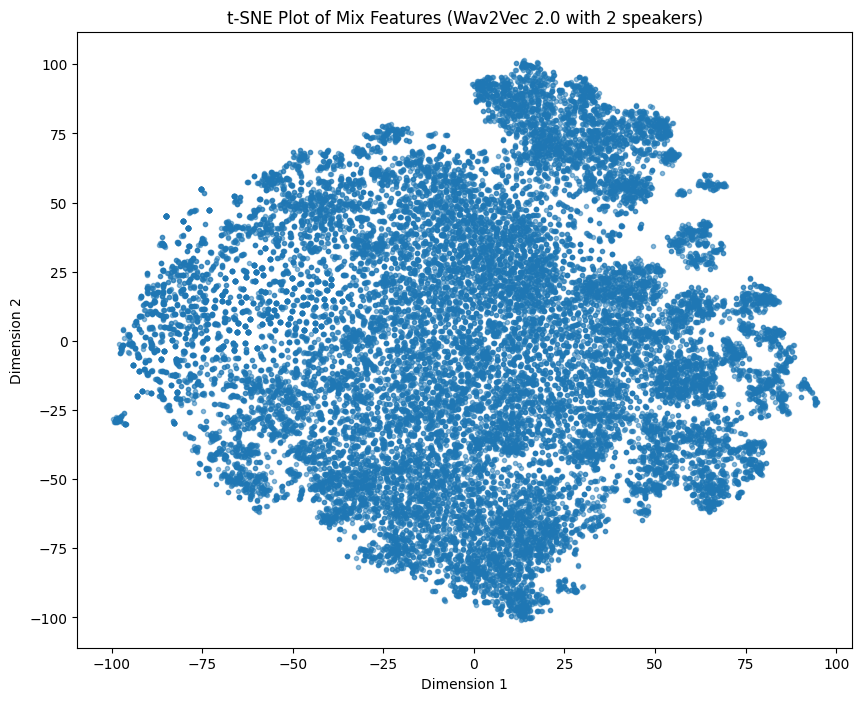

In [13]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot
plt.figure(figsize=(10, 8))
plt.scatter(mix_features_tsne[:, 0], mix_features_tsne[:, 1], marker='.', alpha=0.5)
plt.title('t-SNE Plot of Mix Features (Wav2Vec 2.0 with 2 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.savefig(save_path + '\Wav2Vec 2.0 with 2 speakers.png')
plt.show()


In [14]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, silhouette_score, calinski_harabasz_score, davies_bouldin_score, pairwise_distances

# Assuming source_features_np contains true labels
true_labels = source_features_np.flatten()

# Reshape true_labels to match the shape of mix_features_np
true_labels = true_labels[:len(mix_features_np)]

# Apply KMeans clustering to mix features
num_clusters = 2  # Adjust based on your use case
kmeans = KMeans(n_clusters=num_clusters, random_state=0)

# Fit KMeans to mix features
mix_cluster_labels = kmeans.fit_predict(mix_features_np)

# Evaluate various metrics
ari = adjusted_rand_score(true_labels, mix_cluster_labels)
nmi = normalized_mutual_info_score(true_labels, mix_cluster_labels)
silhouette = silhouette_score(mix_features_np, mix_cluster_labels)
calinski_harabasz = calinski_harabasz_score(mix_features_np, mix_cluster_labels)
davies_bouldin = davies_bouldin_score(mix_features_np, mix_cluster_labels)
avg_silhouette = silhouette.mean()

# Print the metrics
print(f"Adjusted Rand Index: {ari}")
print(f"Normalized Mutual Information: {nmi}")
print(f"Silhouette Score: {silhouette}")
print(f"Average Silhouette Score: {avg_silhouette}")
print(f"Calinski-Harabasz Index: {calinski_harabasz}")
print(f"Davies-Bouldin Index: {davies_bouldin}")


C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and binary values for target
  warnings.warn(msg, UserWarning)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and binary values for target
  warnings.warn(msg, UserWarning)


Adjusted Rand Index: -1.6060438492159357e-11
Normalized Mutual Information: 0.12710410136599995
Silhouette Score: 0.16383318603038788
Average Silhouette Score: 0.16383318603038788
Calinski-Harabasz Index: 6388.8382658989
Davies-Bouldin Index: 1.9941443960795464


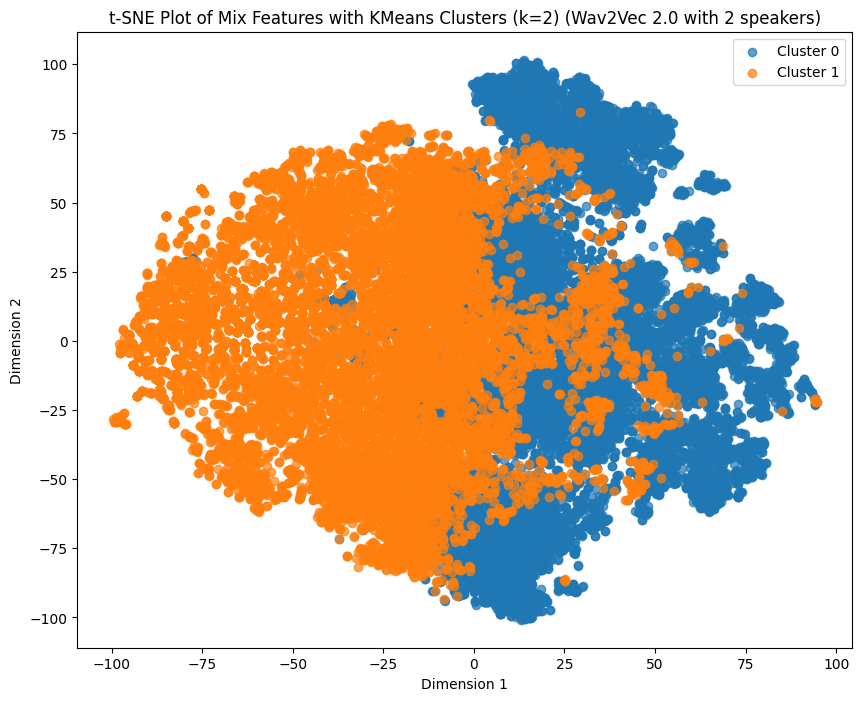

In [15]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot with cluster colors
plt.figure(figsize=(10, 8))
for cluster_label in range(num_clusters):
    cluster_points = mix_features_tsne[mix_cluster_labels == cluster_label]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {cluster_label}', alpha=0.7)

plt.title('t-SNE Plot of Mix Features with KMeans Clusters (k=2) (Wav2Vec 2.0 with 2 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.savefig(save_path + '\Wav2Vec 2.0 with 2 speakers KMeans.png')
plt.show()


In [16]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, silhouette_score, calinski_harabasz_score, davies_bouldin_score, pairwise_distances

# Assuming source_features_np contains true labels
true_labels = source_features_np.flatten()

# Reshape true_labels to match the shape of mix_features_np
true_labels = true_labels[:len(mix_features_np)]

# Apply KMeans clustering to mix features
num_clusters = 3  # Adjust based on your use case
kmeans = KMeans(n_clusters=num_clusters, random_state=0)

# Fit KMeans to mix features
mix_cluster_labels = kmeans.fit_predict(mix_features_np)

# Evaluate various metrics
ari = adjusted_rand_score(true_labels, mix_cluster_labels)
nmi = normalized_mutual_info_score(true_labels, mix_cluster_labels)
silhouette = silhouette_score(mix_features_np, mix_cluster_labels)
calinski_harabasz = calinski_harabasz_score(mix_features_np, mix_cluster_labels)
davies_bouldin = davies_bouldin_score(mix_features_np, mix_cluster_labels)
avg_silhouette = silhouette.mean()

# Print the metrics
print(f"Adjusted Rand Index: {ari}")
print(f"Normalized Mutual Information: {nmi}")
print(f"Silhouette Score: {silhouette}")
print(f"Average Silhouette Score: {avg_silhouette}")
print(f"Calinski-Harabasz Index: {calinski_harabasz}")
print(f"Davies-Bouldin Index: {davies_bouldin}")


C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)


Adjusted Rand Index: 1.2666731484871317e-08
Normalized Mutual Information: 0.17404409349725342
Silhouette Score: 0.1674460470676422
Average Silhouette Score: 0.1674460470676422
Calinski-Harabasz Index: 5029.3254237168785
Davies-Bouldin Index: 1.8375981674290458


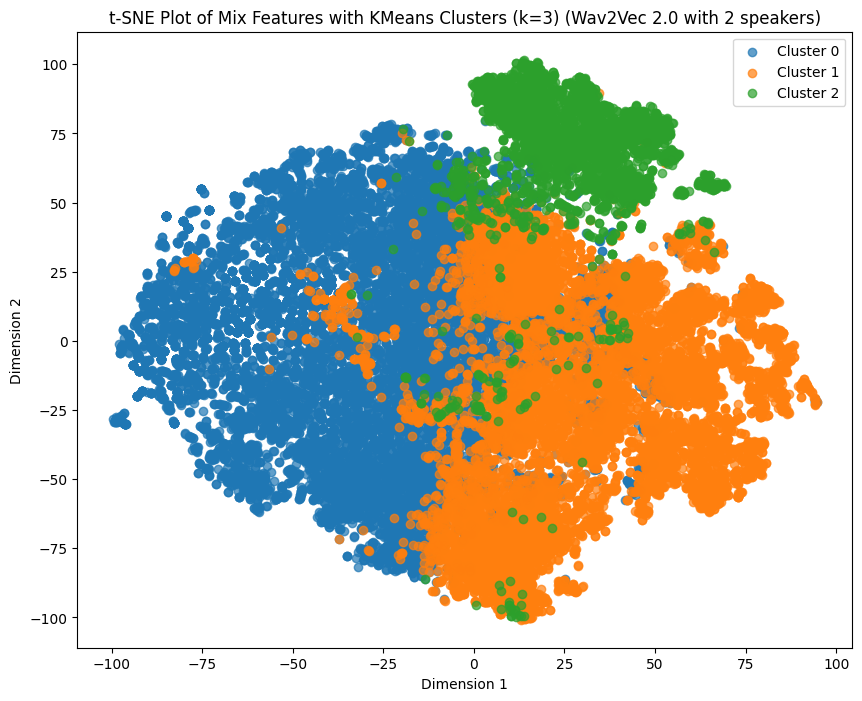

In [17]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot with cluster colors
plt.figure(figsize=(10, 8))
for cluster_label in range(num_clusters):
    cluster_points = mix_features_tsne[mix_cluster_labels == cluster_label]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {cluster_label}', alpha=0.7)

plt.title('t-SNE Plot of Mix Features with KMeans Clusters (k=3) (Wav2Vec 2.0 with 2 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.savefig(save_path + '\Wav2Vec 2.0 with 3 speakers KMeans.png')
plt.show()


In [18]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, silhouette_score, calinski_harabasz_score

# Assuming source_features_np contains true labels
true_labels = source_features_np.flatten()

# Reshape true_labels to match the shape of mix_features_np
true_labels = true_labels[:len(mix_features_np)]

# Apply Agglomerative Clustering to mix features
num_clusters = 2  # Adjust based on your use case
agglo = AgglomerativeClustering(n_clusters=num_clusters)
mix_cluster_labels = agglo.fit_predict(mix_features_np)

# Evaluate various metrics for Agglomerative Clustering
ari = adjusted_rand_score(true_labels, mix_cluster_labels)
nmi = normalized_mutual_info_score(true_labels, mix_cluster_labels)
silhouette = silhouette_score(mix_features_np, mix_cluster_labels)
calinski_harabasz = calinski_harabasz_score(mix_features_np, mix_cluster_labels)
davies_bouldin = davies_bouldin_score(mix_features_np, mix_cluster_labels)

# Print the metrics for Agglomerative Clustering
print("Agglomerative Clustering:")
print(f"Adjusted Rand Index (ARI): {ari}")
print(f"Normalized Mutual Information (NMI): {nmi}")
print(f"Silhouette Score: {silhouette}")
print(f"Calinski-Harabasz Index: {calinski_harabasz}")
print(f"Davies-Bouldin Index: {davies_bouldin}")


C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and binary values for target
  warnings.warn(msg, UserWarning)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and binary values for target
  warnings.warn(msg, UserWarning)


Agglomerative Clustering:
Adjusted Rand Index (ARI): -1.673036513591445e-08
Normalized Mutual Information (NMI): 0.11333184010583805
Silhouette Score: 0.14229844510555267
Calinski-Harabasz Index: 3900.05400343466
Davies-Bouldin Index: 2.4030706800546677


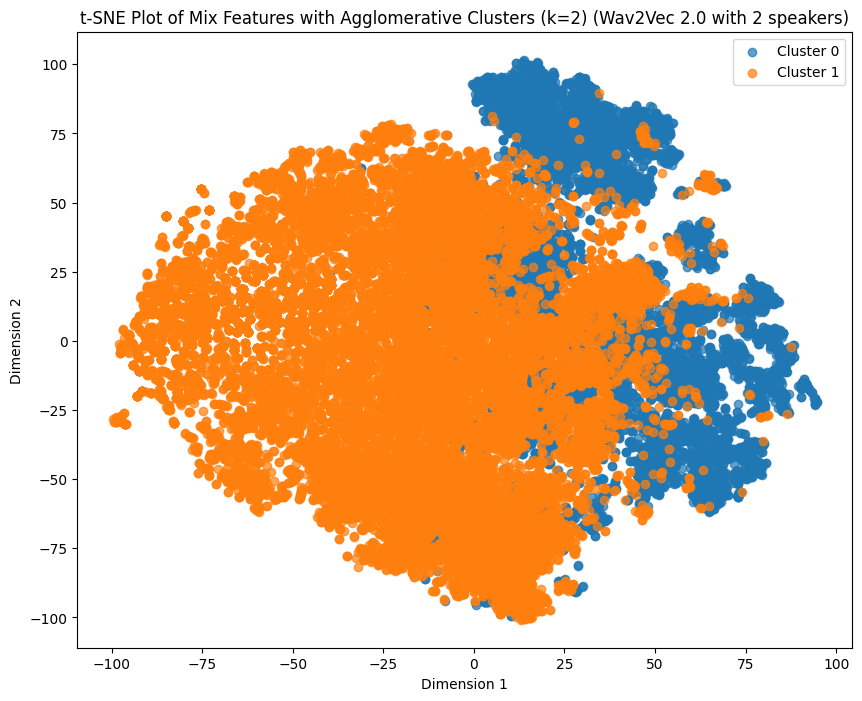

In [19]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot with cluster colors
plt.figure(figsize=(10, 8))
for cluster_label in range(num_clusters):
    cluster_points = mix_features_tsne[mix_cluster_labels == cluster_label]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {cluster_label}', alpha=0.7)

plt.title('t-SNE Plot of Mix Features with Agglomerative Clusters (k=2) (Wav2Vec 2.0 with 2 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.savefig(save_path + '\Wav2Vec 2.0 with 2 speakers k=2 Agglomerative.png')
plt.show()


In [20]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

# Assuming source_features_np contains true labels
true_labels = source_features_np.flatten()

# Reshape true_labels to match the shape of mix_features_np
true_labels = true_labels[:len(mix_features_np)]

# Apply DBSCAN clustering to mix features
eps = 0.5  # Adjust based on your use case
min_samples = 2  # Adjust based on your use case
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
mix_cluster_labels = dbscan.fit_predict(mix_features_np)

# Evaluate various metrics for DBSCAN
ari = adjusted_rand_score(true_labels, mix_cluster_labels)
nmi = normalized_mutual_info_score(true_labels, mix_cluster_labels)
silhouette = silhouette_score(mix_features_np, mix_cluster_labels)
calinski_harabasz = calinski_harabasz_score(mix_features_np, mix_cluster_labels)
davies_bouldin = davies_bouldin_score(mix_features_np, mix_cluster_labels)

# Print the metrics for DBSCAN
print("DBSCAN:")
print(f"Adjusted Rand Index (ARI): {ari}")
print(f"Normalized Mutual Information (NMI): {nmi}")
print(f"Silhouette Score: {silhouette}")
print(f"Calinski-Harabasz Index: {calinski_harabasz}")
print(f"Davies-Bouldin Index: {davies_bouldin}")


C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)


DBSCAN:
Adjusted Rand Index (ARI): 4.882507815314639e-09
Normalized Mutual Information (NMI): 0.07217670506284884
Silhouette Score: -0.3205432593822479
Calinski-Harabasz Index: 2.491965306738174
Davies-Bouldin Index: 1.6150529778701144


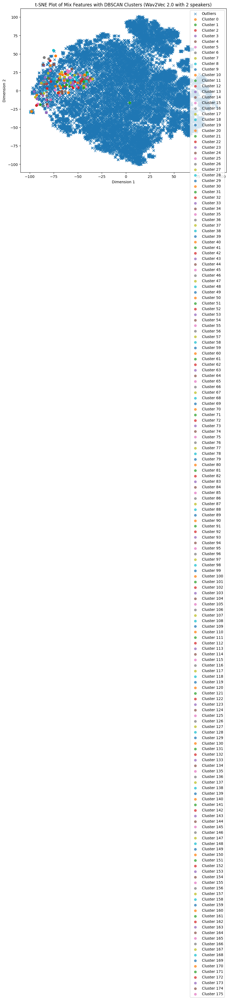

In [21]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot with DBSCAN clusters
plt.figure(figsize=(10, 8))



# Identify core samples and outliers
core_samples_mask = np.zeros_like(mix_cluster_labels, dtype=bool)
core_samples_mask[dbscan.core_sample_indices_] = True
outliers_mask = (mix_cluster_labels == -1) & ~core_samples_mask

outliers = mix_features_tsne[outliers_mask]
plt.scatter(outliers[:, 0], outliers[:, 1], marker='x', label='Outliers', alpha=0.7)

# Plot core samples with different colors for each cluster
for label in set(mix_cluster_labels):
    if label != -1:
        cluster_points = mix_features_tsne[mix_cluster_labels == label]
        plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {label}', alpha=0.7)

# Plot outliers with a different marker


plt.title('t-SNE Plot of Mix Features with DBSCAN Clusters (Wav2Vec 2.0 with 2 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.savefig(save_path + '\Wav2Vec 2.0 with 2 speakers DBSCAN.png')
plt.show()


In [22]:
from sklearn.mixture import GaussianMixture
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

# Assuming source_features_np contains true labels
true_labels = source_features_np.flatten()

# Reshape true_labels to match the shape of mix_features_np
true_labels = true_labels[:len(mix_features_np)]

# Apply Gaussian Mixture Model clustering to mix features
num_components = 2  # Adjust based on your use case
gmm = GaussianMixture(n_components=num_components)
mix_cluster_labels = gmm.fit_predict(mix_features_np)

# Evaluate various metrics for GMM
ari = adjusted_rand_score(true_labels, mix_cluster_labels)
nmi = normalized_mutual_info_score(true_labels, mix_cluster_labels)
silhouette = silhouette_score(mix_features_np, mix_cluster_labels)
calinski_harabasz = calinski_harabasz_score(mix_features_np, mix_cluster_labels)
davies_bouldin = davies_bouldin_score(mix_features_np, mix_cluster_labels)

# Print the metrics for GMM
print("Gaussian Mixture Model:")
print(f"Adjusted Rand Index (ARI): {ari}")
print(f"Normalized Mutual Information (NMI): {nmi}")
print(f"Silhouette Score: {silhouette}")
print(f"Calinski-Harabasz Index: {calinski_harabasz}")
print(f"Davies-Bouldin Index: {davies_bouldin}")


C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and binary values for target
  warnings.warn(msg, UserWarning)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and binary values for target
  warnings.warn(msg, UserWarning)


Gaussian Mixture Model:
Adjusted Rand Index (ARI): 5.131508795398157e-09
Normalized Mutual Information (NMI): 0.10153726525011424
Silhouette Score: -0.027238894253969193
Calinski-Harabasz Index: 602.1755540374118
Davies-Bouldin Index: 4.967261874628626


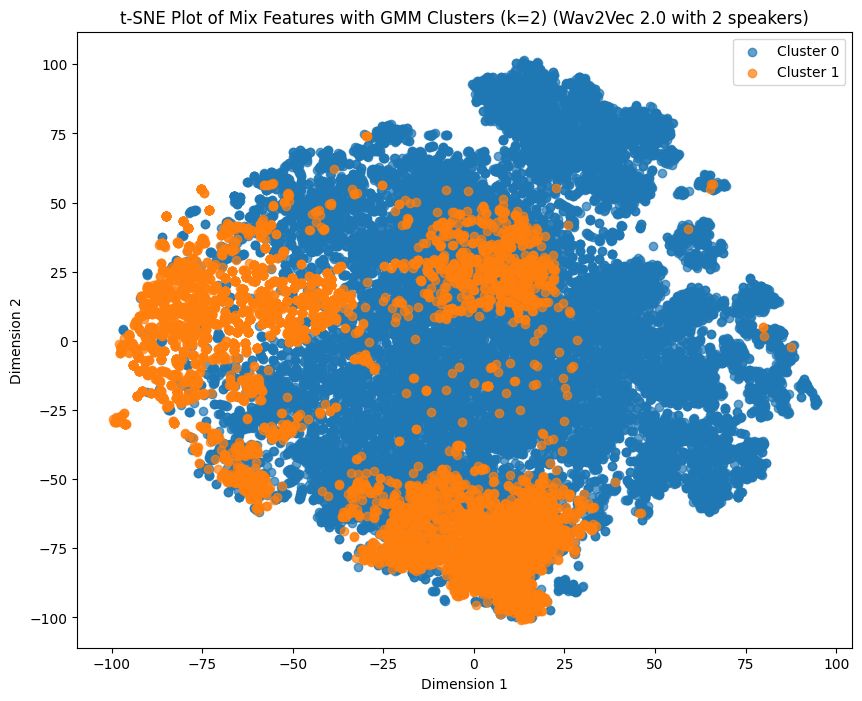

In [23]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot with cluster colors
plt.figure(figsize=(10, 8))
for cluster_label in range(num_components):
    cluster_points = mix_features_tsne[mix_cluster_labels == cluster_label]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {cluster_label}', alpha=0.7)

plt.title('t-SNE Plot of Mix Features with GMM Clusters (k=2) (Wav2Vec 2.0 with 2 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.savefig(save_path + '\Wav2Vec 2.0 with 2 speakers k=2 GMM.png')
plt.show()


In [24]:
train_set_3, _ = LibriMixDataset(dev_mode=True, num_speakers=3).load_dataset()

In [25]:
train_set_3 = train_set_3[:100]

Wav2Vec 2.0 with 3 speakers

In [26]:
import torch
from torch import nn
from sklearn.metrics import davies_bouldin_score
from transformers import Wav2Vec2ForCTC, Wav2Vec2Processor

# Define Wav2Vec 2.0 model and processor
processor = Wav2Vec2Processor.from_pretrained("facebook/wav2vec2-base-960h")
model = Wav2Vec2ForCTC.from_pretrained("facebook/wav2vec2-base-960h")

# Move the model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Freeze the parameters of the Wav2Vec 2.0 model
for param in model.parameters():
    param.requires_grad = False

# Define your clustering model

# Define your training data
# Replace this with your actual training data loading logic
sampling_rate = 16000  # Adjust based on your data

# Feature extraction and clustering
mix_features_list = []
source_features_list = []

for _, mix_waveform, source_waveforms in train_set_3:
    # Feature extraction using Wav2Vec 2.0 for mix waveform
    mix_input_values = processor(mix_waveform, return_tensors="pt", padding="longest", sampling_rate=16000).input_values.squeeze().to(device)
    mix_outputs = model(mix_input_values.unsqueeze(0))
    mix_logits = mix_outputs.logits.squeeze().detach().cpu()
    mix_features_list.append(mix_logits)

    # Feature extraction using Wav2Vec 2.0 for each source waveform
    for source_waveform in source_waveforms:
        source_input_values = processor(source_waveform, return_tensors="pt", padding="longest", sampling_rate=16000).input_values.squeeze().to(device)
        source_outputs = model(source_input_values.unsqueeze(0))
        source_logits = source_outputs.logits.squeeze().detach().cpu()
        source_features_list.append(source_logits)

# Convert features to numpy arrays
mix_features_np = torch.cat(mix_features_list).detach()
source_features_np = torch.cat(source_features_list).detach()

# Convert features to numpy arrays and move them back to CPU
mix_features_np = mix_features_np.cpu().numpy()
source_features_np = source_features_np.cpu().numpy()


# Rest of your code for clustering and evaluation


Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/wav2vec2-base-960h and are newly initialized: ['wav2vec2.masked_spec_embed']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


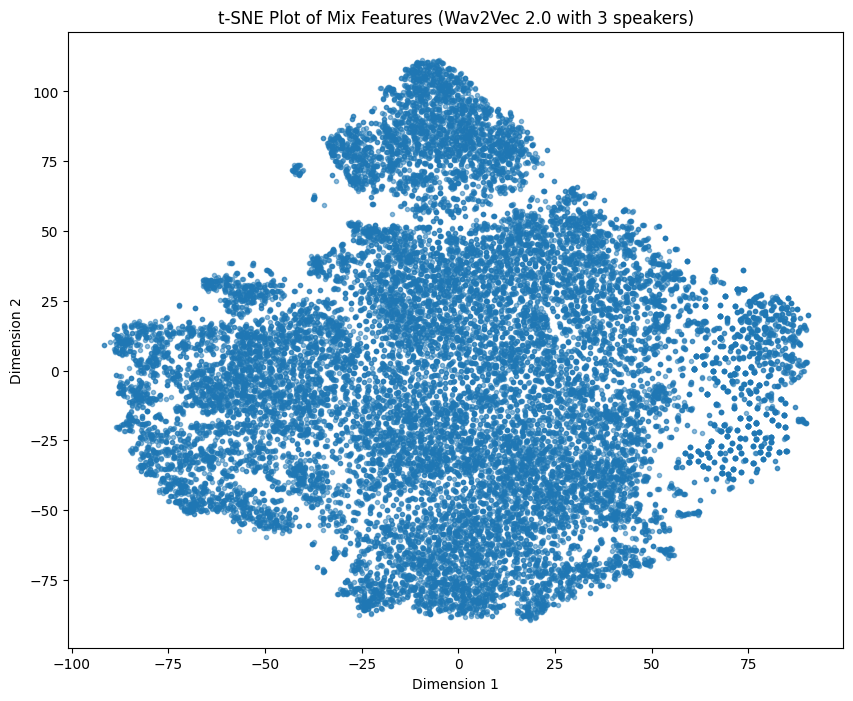

In [27]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot
plt.figure(figsize=(10, 8))
plt.scatter(mix_features_tsne[:, 0], mix_features_tsne[:, 1], marker='.', alpha=0.5)
plt.title('t-SNE Plot of Mix Features (Wav2Vec 2.0 with 3 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.savefig(save_path + '\Wav2Vec 2.0 with 3 speakers.png')
plt.show()


In [28]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, silhouette_score, calinski_harabasz_score, davies_bouldin_score, pairwise_distances

# Assuming source_features_np contains true labels
true_labels = source_features_np.flatten()

# Reshape true_labels to match the shape of mix_features_np
true_labels = true_labels[:len(mix_features_np)]

# Apply KMeans clustering to mix features
num_clusters = 3  # Adjust based on your use case
kmeans = KMeans(n_clusters=num_clusters, random_state=0)

# Fit KMeans to mix features
mix_cluster_labels = kmeans.fit_predict(mix_features_np)

# Evaluate various metrics
ari = adjusted_rand_score(true_labels, mix_cluster_labels)
nmi = normalized_mutual_info_score(true_labels, mix_cluster_labels)
silhouette = silhouette_score(mix_features_np, mix_cluster_labels)
calinski_harabasz = calinski_harabasz_score(mix_features_np, mix_cluster_labels)
davies_bouldin = davies_bouldin_score(mix_features_np, mix_cluster_labels)
avg_silhouette = silhouette.mean()

# Print the metrics
print(f"Adjusted Rand Index: {ari}")
print(f"Normalized Mutual Information: {nmi}")
print(f"Silhouette Score: {silhouette}")
print(f"Average Silhouette Score: {avg_silhouette}")
print(f"Calinski-Harabasz Index: {calinski_harabasz}")
print(f"Davies-Bouldin Index: {davies_bouldin}")


C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)


Adjusted Rand Index: -1.7724268487683322e-08
Normalized Mutual Information: 0.17706536574896184
Silhouette Score: 0.1600576490163803
Average Silhouette Score: 0.1600576490163803
Calinski-Harabasz Index: 4252.681634073621
Davies-Bouldin Index: 1.8601019890454917


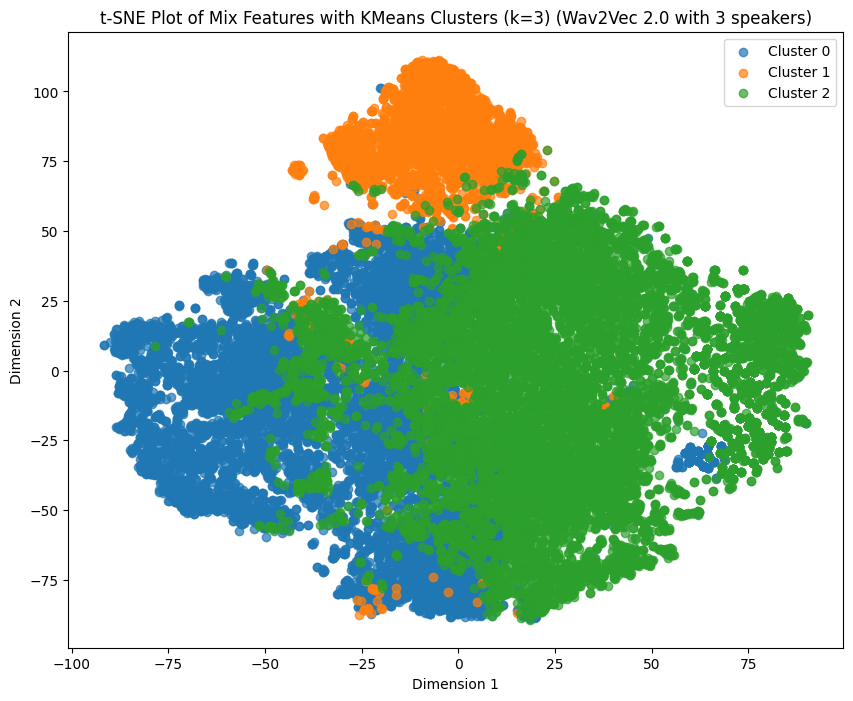

In [29]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot with cluster colors
plt.figure(figsize=(10, 8))
for cluster_label in range(num_clusters):
    cluster_points = mix_features_tsne[mix_cluster_labels == cluster_label]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {cluster_label}', alpha=0.7)

plt.title('t-SNE Plot of Mix Features with KMeans Clusters (k=3) (Wav2Vec 2.0 with 3 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.savefig(save_path + '\Wav2Vec 2.0 with 3 speakers k=3 KMeans.png')
plt.show()


In [30]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, silhouette_score, calinski_harabasz_score, davies_bouldin_score, pairwise_distances

# Assuming source_features_np contains true labels
true_labels = source_features_np.flatten()

# Reshape true_labels to match the shape of mix_features_np
true_labels = true_labels[:len(mix_features_np)]

# Apply KMeans clustering to mix features
num_clusters = 4  # Adjust based on your use case
kmeans = KMeans(n_clusters=num_clusters, random_state=0)

# Fit KMeans to mix features
mix_cluster_labels = kmeans.fit_predict(mix_features_np)

# Evaluate various metrics
ari = adjusted_rand_score(true_labels, mix_cluster_labels)
nmi = normalized_mutual_info_score(true_labels, mix_cluster_labels)
silhouette = silhouette_score(mix_features_np, mix_cluster_labels)
calinski_harabasz = calinski_harabasz_score(mix_features_np, mix_cluster_labels)
davies_bouldin = davies_bouldin_score(mix_features_np, mix_cluster_labels)
avg_silhouette = silhouette.mean()

# Print the metrics
print(f"Adjusted Rand Index: {ari}")
print(f"Normalized Mutual Information: {nmi}")
print(f"Silhouette Score: {silhouette}")
print(f"Average Silhouette Score: {avg_silhouette}")
print(f"Calinski-Harabasz Index: {calinski_harabasz}")
print(f"Davies-Bouldin Index: {davies_bouldin}")


C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)


Adjusted Rand Index: -2.4673146986135595e-08
Normalized Mutual Information: 0.22363046596704517
Silhouette Score: 0.1259773224592209
Average Silhouette Score: 0.1259773224592209
Calinski-Harabasz Index: 3604.9826219607635
Davies-Bouldin Index: 2.1978694134603325


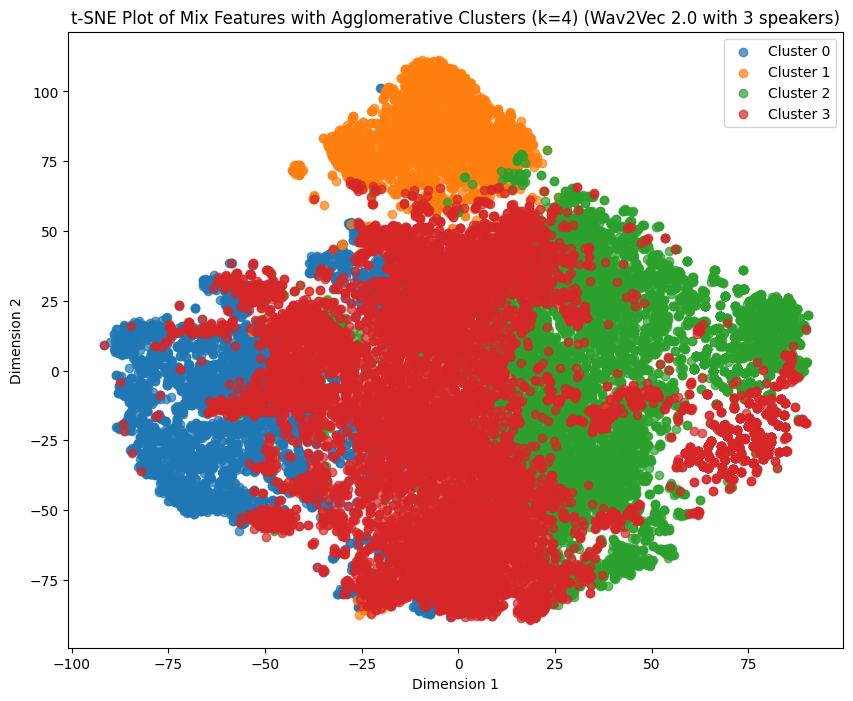

In [31]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot with cluster colors
plt.figure(figsize=(10, 8))
for cluster_label in range(num_clusters):
    cluster_points = mix_features_tsne[mix_cluster_labels == cluster_label]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {cluster_label}', alpha=0.7)

plt.title('t-SNE Plot of Mix Features with Agglomerative Clusters (k=4) (Wav2Vec 2.0 with 3 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.savefig(save_path + '\Wav2Vec 2.0 with 3 speakers k=4 KMeans.png')
plt.show()


In [32]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, silhouette_score, calinski_harabasz_score

# Assuming source_features_np contains true labels
true_labels = source_features_np.flatten()

# Reshape true_labels to match the shape of mix_features_np
true_labels = true_labels[:len(mix_features_np)]

# Apply Agglomerative Clustering to mix features
num_clusters = 3  # Adjust based on your use case
agglo = AgglomerativeClustering(n_clusters=num_clusters)
mix_cluster_labels = agglo.fit_predict(mix_features_np)

# Evaluate various metrics for Agglomerative Clustering
ari = adjusted_rand_score(true_labels, mix_cluster_labels)
nmi = normalized_mutual_info_score(true_labels, mix_cluster_labels)
silhouette = silhouette_score(mix_features_np, mix_cluster_labels)
calinski_harabasz = calinski_harabasz_score(mix_features_np, mix_cluster_labels)
davies_bouldin = davies_bouldin_score(mix_features_np, mix_cluster_labels)

# Print the metrics for Agglomerative Clustering
print("Agglomerative Clustering:")
print(f"Adjusted Rand Index (ARI): {ari}")
print(f"Normalized Mutual Information (NMI): {nmi}")
print(f"Silhouette Score: {silhouette}")
print(f"Calinski-Harabasz Index: {calinski_harabasz}")
print(f"Davies-Bouldin Index: {davies_bouldin}")


C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)


Agglomerative Clustering:
Adjusted Rand Index (ARI): -1.8546858171072543e-08
Normalized Mutual Information (NMI): 0.17650460921257213
Silhouette Score: 0.12536773085594177
Calinski-Harabasz Index: 3431.424217120852
Davies-Bouldin Index: 2.1013459458417323


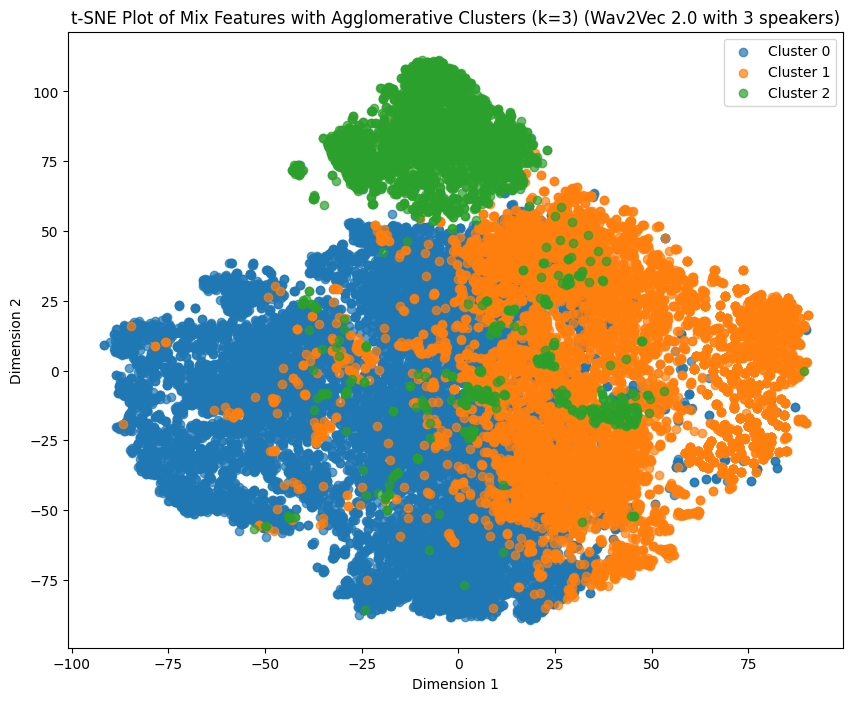

In [33]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot with cluster colors
plt.figure(figsize=(10, 8))
for cluster_label in range(num_clusters):
    cluster_points = mix_features_tsne[mix_cluster_labels == cluster_label]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {cluster_label}', alpha=0.7)

plt.title('t-SNE Plot of Mix Features with Agglomerative Clusters (k=3) (Wav2Vec 2.0 with 3 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.savefig(save_path + '\Wav2Vec 2.0 with 3 speakers k=3 Agglomerative.png')
plt.show()


In [34]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

# Assuming source_features_np contains true labels
true_labels = source_features_np.flatten()

# Reshape true_labels to match the shape of mix_features_np
true_labels = true_labels[:len(mix_features_np)]

# Apply DBSCAN clustering to mix features
eps = 0.5  # Adjust based on your use case
min_samples = 2  # Adjust based on your use case
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
mix_cluster_labels = dbscan.fit_predict(mix_features_np)

# Evaluate various metrics for DBSCAN
ari = adjusted_rand_score(true_labels, mix_cluster_labels)
nmi = normalized_mutual_info_score(true_labels, mix_cluster_labels)
silhouette = silhouette_score(mix_features_np, mix_cluster_labels)
calinski_harabasz = calinski_harabasz_score(mix_features_np, mix_cluster_labels)
davies_bouldin = davies_bouldin_score(mix_features_np, mix_cluster_labels)

# Print the metrics for DBSCAN
print("DBSCAN:")
print(f"Adjusted Rand Index (ARI): {ari}")
print(f"Normalized Mutual Information (NMI): {nmi}")
print(f"Silhouette Score: {silhouette}")
print(f"Calinski-Harabasz Index: {calinski_harabasz}")
print(f"Davies-Bouldin Index: {davies_bouldin}")


C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)


DBSCAN:
Adjusted Rand Index (ARI): 5.4682696372255906e-09
Normalized Mutual Information (NMI): 0.06483553606497512
Silhouette Score: -0.3133033215999603
Calinski-Harabasz Index: 2.023768003870877
Davies-Bouldin Index: 1.8055357087714166


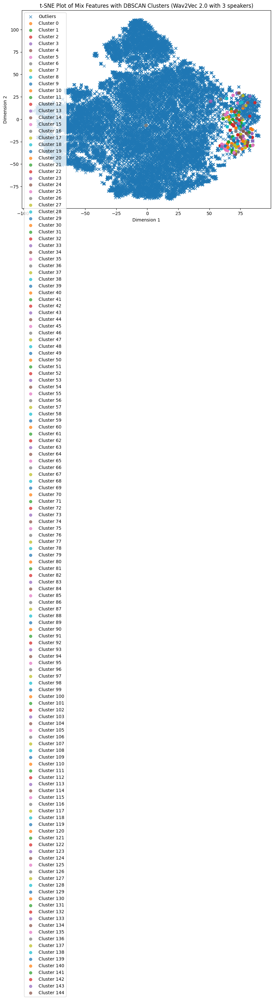

In [35]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot with DBSCAN clusters
plt.figure(figsize=(10, 8))



# Identify core samples and outliers
core_samples_mask = np.zeros_like(mix_cluster_labels, dtype=bool)
core_samples_mask[dbscan.core_sample_indices_] = True
outliers_mask = (mix_cluster_labels == -1) & ~core_samples_mask

outliers = mix_features_tsne[outliers_mask]
plt.scatter(outliers[:, 0], outliers[:, 1], marker='x', label='Outliers', alpha=0.7)

# Plot core samples with different colors for each cluster
for label in set(mix_cluster_labels):
    if label != -1:
        cluster_points = mix_features_tsne[mix_cluster_labels == label]
        plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {label}', alpha=0.7)

# Plot outliers with a different marker


plt.title('t-SNE Plot of Mix Features with DBSCAN Clusters (Wav2Vec 2.0 with 3 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.savefig(save_path + '\Wav2Vec 2.0 with 3 speakers DBSCAN.png')
plt.show()


In [36]:
from sklearn.mixture import GaussianMixture
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

# Assuming source_features_np contains true labels
true_labels = source_features_np.flatten()

# Reshape true_labels to match the shape of mix_features_np
true_labels = true_labels[:len(mix_features_np)]

# Apply Gaussian Mixture Model clustering to mix features
num_components = 3  # Adjust based on your use case
gmm = GaussianMixture(n_components=num_components)
mix_cluster_labels = gmm.fit_predict(mix_features_np)

# Evaluate various metrics for GMM
ari = adjusted_rand_score(true_labels, mix_cluster_labels)
nmi = normalized_mutual_info_score(true_labels, mix_cluster_labels)
silhouette = silhouette_score(mix_features_np, mix_cluster_labels)
calinski_harabasz = calinski_harabasz_score(mix_features_np, mix_cluster_labels)
davies_bouldin = davies_bouldin_score(mix_features_np, mix_cluster_labels)

# Print the metrics for GMM
print("Gaussian Mixture Model:")
print(f"Adjusted Rand Index (ARI): {ari}")
print(f"Normalized Mutual Information (NMI): {nmi}")
print(f"Silhouette Score: {silhouette}")
print(f"Calinski-Harabasz Index: {calinski_harabasz}")
print(f"Davies-Bouldin Index: {davies_bouldin}")


C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)


Gaussian Mixture Model:
Adjusted Rand Index (ARI): -8.156262967390714e-09
Normalized Mutual Information (NMI): 0.16605408325598842
Silhouette Score: 0.036645613610744476
Calinski-Harabasz Index: 1902.4182638681912
Davies-Bouldin Index: 3.954115415322304


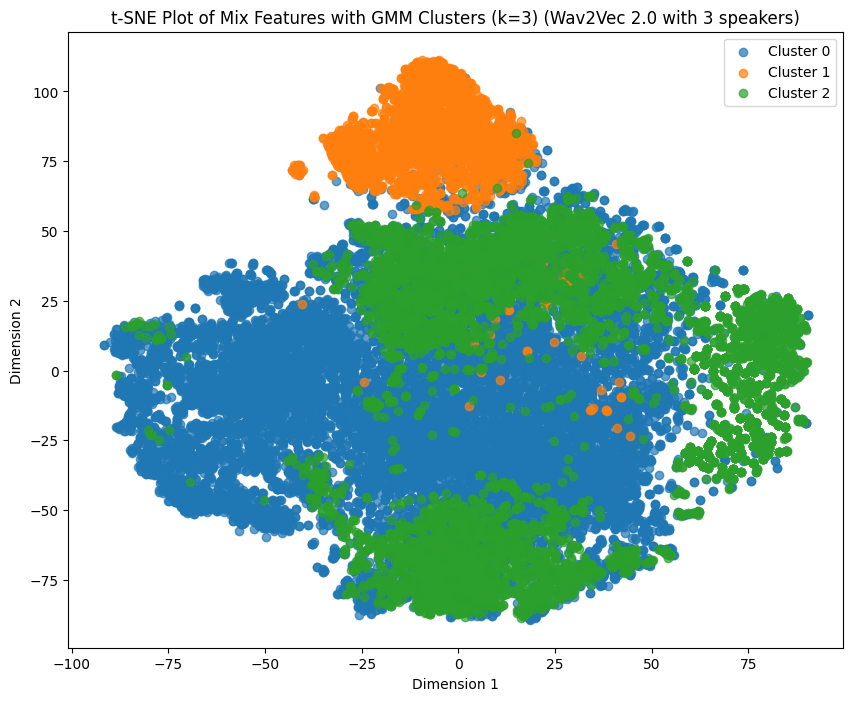

In [37]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot with cluster colors
plt.figure(figsize=(10, 8))
for cluster_label in range(num_components):
    cluster_points = mix_features_tsne[mix_cluster_labels == cluster_label]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {cluster_label}', alpha=0.7)

plt.title('t-SNE Plot of Mix Features with GMM Clusters (k=3) (Wav2Vec 2.0 with 3 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.savefig(save_path + '\Wav2Vec 2.0 with 3 speakers k=3 GMM.png')
plt.show()


WavLM with 2 speakers

In [38]:
import torch
from torch import nn
from sklearn.metrics import davies_bouldin_score
from transformers import WavLMForCTC, Wav2Vec2Processor

# Define Wav2Vec 2.0 model and processor
processor = Wav2Vec2Processor.from_pretrained("facebook/wav2vec2-base-960h")
model = WavLMForCTC.from_pretrained("patrickvonplaten/wavlm-libri-clean-100h-base")

# Move the model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Freeze the parameters of the Wav2Vec 2.0 model
for param in model.parameters():
    param.requires_grad = False

# Define your clustering model

# Define your training data
# Replace this with your actual training data loading logic
sampling_rate = 16000  # Adjust based on your data

# Feature extraction and clustering
mix_features_list = []
source_features_list = []

for _, mix_waveform, source_waveforms in train_set:
    # Feature extraction using Wav2Vec 2.0 for mix waveform
    mix_input_values = processor(mix_waveform, return_tensors="pt", padding="longest", sampling_rate=16000).input_values.squeeze().to(device)
    mix_outputs = model(mix_input_values.unsqueeze(0))
    mix_logits = mix_outputs.logits.squeeze().detach().cpu()
    mix_features_list.append(mix_logits)

    # Feature extraction using Wav2Vec 2.0 for each source waveform
    for source_waveform in source_waveforms:
        source_input_values = processor(source_waveform, return_tensors="pt", padding="longest", sampling_rate=16000).input_values.squeeze().to(device)
        source_outputs = model(source_input_values.unsqueeze(0))
        source_logits = source_outputs.logits.squeeze().detach().cpu()
        source_features_list.append(source_logits)

# Convert features to numpy arrays
mix_features_np = torch.cat(mix_features_list).detach()
source_features_np = torch.cat(source_features_list).detach()

# Convert features to numpy arrays and move them back to CPU
mix_features_np = mix_features_np.cpu().numpy()
source_features_np = source_features_np.cpu().numpy()


# Rest of your code for clustering and evaluation


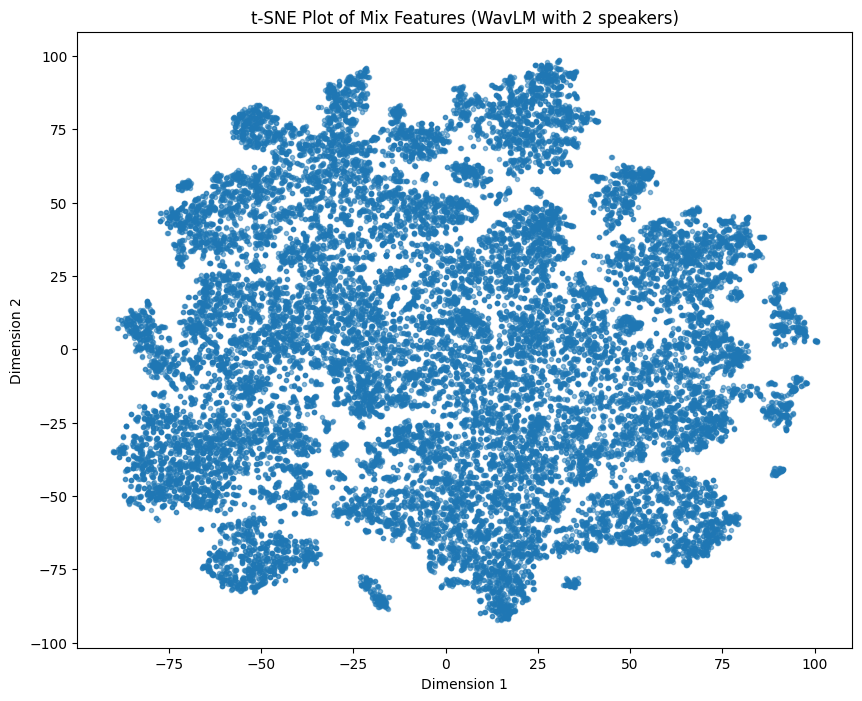

In [39]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot
plt.figure(figsize=(10, 8))
plt.scatter(mix_features_tsne[:, 0], mix_features_tsne[:, 1], marker='.', alpha=0.5)
plt.title('t-SNE Plot of Mix Features (WavLM with 2 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.savefig(save_path + '\WavLM with 2 speakers.png')
plt.show()


In [40]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, silhouette_score, calinski_harabasz_score, davies_bouldin_score, pairwise_distances

# Assuming source_features_np contains true labels
true_labels = source_features_np.flatten()

# Reshape true_labels to match the shape of mix_features_np
true_labels = true_labels[:len(mix_features_np)]

# Apply KMeans clustering to mix features
num_clusters = 3  # Adjust based on your use case
kmeans = KMeans(n_clusters=num_clusters, random_state=0)

# Fit KMeans to mix features
mix_cluster_labels = kmeans.fit_predict(mix_features_np)

# Evaluate various metrics
ari = adjusted_rand_score(true_labels, mix_cluster_labels)
nmi = normalized_mutual_info_score(true_labels, mix_cluster_labels)
silhouette = silhouette_score(mix_features_np, mix_cluster_labels)
calinski_harabasz = calinski_harabasz_score(mix_features_np, mix_cluster_labels)
davies_bouldin = davies_bouldin_score(mix_features_np, mix_cluster_labels)
avg_silhouette = silhouette.mean()

# Print the metrics
print(f"Adjusted Rand Index: {ari}")
print(f"Normalized Mutual Information: {nmi}")
print(f"Silhouette Score: {silhouette}")
print(f"Average Silhouette Score: {avg_silhouette}")
print(f"Calinski-Harabasz Index: {calinski_harabasz}")
print(f"Davies-Bouldin Index: {davies_bouldin}")


C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)


Adjusted Rand Index: -2.266579534112987e-08
Normalized Mutual Information: 0.18781927698640133
Silhouette Score: 0.1845598816871643
Average Silhouette Score: 0.1845598816871643
Calinski-Harabasz Index: 5178.854395553751
Davies-Bouldin Index: 1.8538147621582926


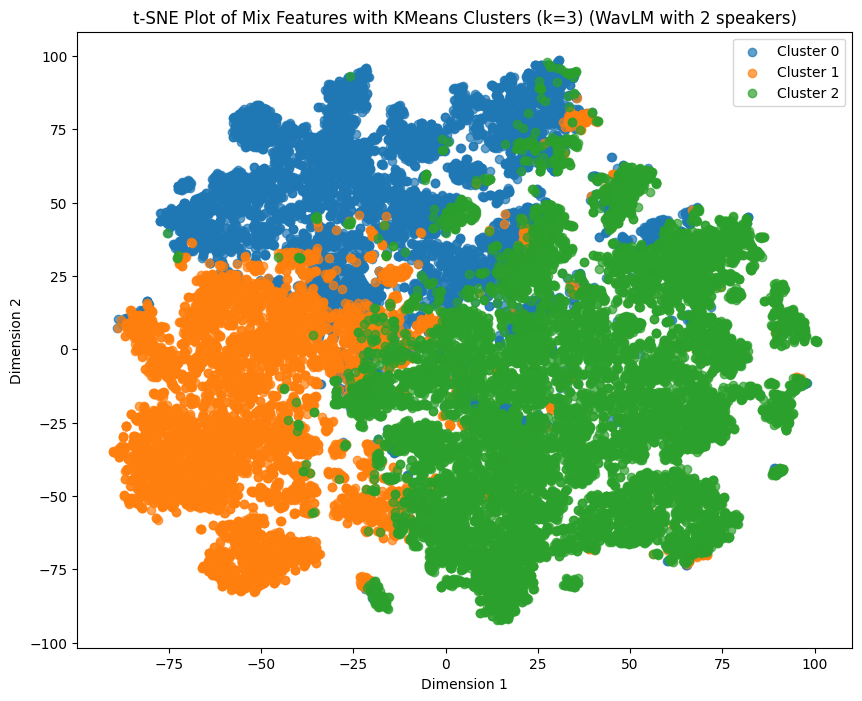

In [41]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot with cluster colors
plt.figure(figsize=(10, 8))
for cluster_label in range(num_clusters):
    cluster_points = mix_features_tsne[mix_cluster_labels == cluster_label]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {cluster_label}', alpha=0.7)

plt.title('t-SNE Plot of Mix Features with KMeans Clusters (k=3) (WavLM with 2 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.savefig(save_path + '\WavLM with 2 speakers k=3 KMeans.png')
plt.show()


In [42]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, silhouette_score, calinski_harabasz_score, davies_bouldin_score, pairwise_distances

# Assuming source_features_np contains true labels
true_labels = source_features_np.flatten()

# Reshape true_labels to match the shape of mix_features_np
true_labels = true_labels[:len(mix_features_np)]

# Apply KMeans clustering to mix features
num_clusters = 2  # Adjust based on your use case
kmeans = KMeans(n_clusters=num_clusters, random_state=0)

# Fit KMeans to mix features
mix_cluster_labels = kmeans.fit_predict(mix_features_np)

# Evaluate various metrics
ari = adjusted_rand_score(true_labels, mix_cluster_labels)
nmi = normalized_mutual_info_score(true_labels, mix_cluster_labels)
silhouette = silhouette_score(mix_features_np, mix_cluster_labels)
calinski_harabasz = calinski_harabasz_score(mix_features_np, mix_cluster_labels)
davies_bouldin = davies_bouldin_score(mix_features_np, mix_cluster_labels)
avg_silhouette = silhouette.mean()

# Print the metrics
print(f"Adjusted Rand Index: {ari}")
print(f"Normalized Mutual Information: {nmi}")
print(f"Silhouette Score: {silhouette}")
print(f"Average Silhouette Score: {avg_silhouette}")
print(f"Calinski-Harabasz Index: {calinski_harabasz}")
print(f"Davies-Bouldin Index: {davies_bouldin}")


C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and binary values for target
  warnings.warn(msg, UserWarning)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and binary values for target
  warnings.warn(msg, UserWarning)


Adjusted Rand Index: 1.0695288926062623e-08
Normalized Mutual Information: 0.1269556714699596
Silhouette Score: 0.16233667731285095
Average Silhouette Score: 0.16233667731285095
Calinski-Harabasz Index: 4868.758652109851
Davies-Bouldin Index: 2.2811011710344253


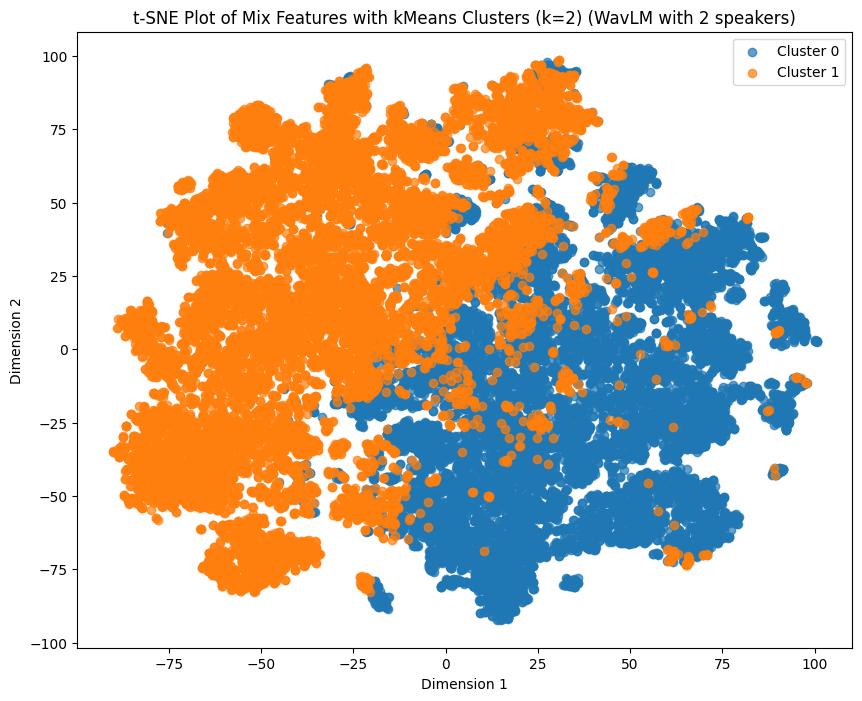

In [43]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot with cluster colors
plt.figure(figsize=(10, 8))
for cluster_label in range(num_clusters):
    cluster_points = mix_features_tsne[mix_cluster_labels == cluster_label]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {cluster_label}', alpha=0.7)

plt.title('t-SNE Plot of Mix Features with kMeans Clusters (k=2) (WavLM with 2 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.savefig(save_path + '\WavLM with 2 speakers k=2 KMeans.png')
plt.show()


In [44]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, silhouette_score, calinski_harabasz_score

# Assuming source_features_np contains true labels
true_labels = source_features_np.flatten()

# Reshape true_labels to match the shape of mix_features_np
true_labels = true_labels[:len(mix_features_np)]

# Apply Agglomerative Clustering to mix features
num_clusters = 2  # Adjust based on your use case
agglo = AgglomerativeClustering(n_clusters=num_clusters)
mix_cluster_labels = agglo.fit_predict(mix_features_np)

# Evaluate various metrics for Agglomerative Clustering
ari = adjusted_rand_score(true_labels, mix_cluster_labels)
nmi = normalized_mutual_info_score(true_labels, mix_cluster_labels)
silhouette = silhouette_score(mix_features_np, mix_cluster_labels)
calinski_harabasz = calinski_harabasz_score(mix_features_np, mix_cluster_labels)
davies_bouldin = davies_bouldin_score(mix_features_np, mix_cluster_labels)

# Print the metrics for Agglomerative Clustering
print("Agglomerative Clustering:")
print(f"Adjusted Rand Index (ARI): {ari}")
print(f"Normalized Mutual Information (NMI): {nmi}")
print(f"Silhouette Score: {silhouette}")
print(f"Calinski-Harabasz Index: {calinski_harabasz}")
print(f"Davies-Bouldin Index: {davies_bouldin}")


C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and binary values for target
  warnings.warn(msg, UserWarning)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and binary values for target
  warnings.warn(msg, UserWarning)


Agglomerative Clustering:
Adjusted Rand Index (ARI): -2.575547370487499e-09
Normalized Mutual Information (NMI): 0.09244851612938797
Silhouette Score: 0.10419091582298279
Calinski-Harabasz Index: 3859.1779927939783
Davies-Bouldin Index: 1.588192446006585


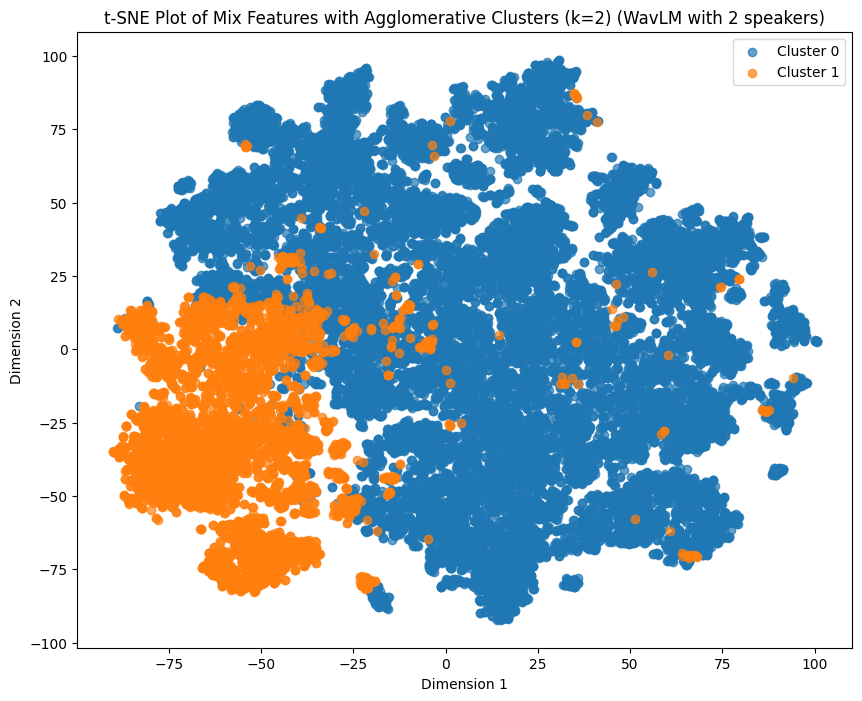

In [45]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot with cluster colors
plt.figure(figsize=(10, 8))
for cluster_label in range(num_clusters):
    cluster_points = mix_features_tsne[mix_cluster_labels == cluster_label]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {cluster_label}', alpha=0.7)

plt.title('t-SNE Plot of Mix Features with Agglomerative Clusters (k=2) (WavLM with 2 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.savefig(save_path + '\WavLM with 2 speakers k=2 Agglomerative.png')
plt.show()


In [46]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

# Assuming source_features_np contains true labels
true_labels = source_features_np.flatten()

# Reshape true_labels to match the shape of mix_features_np
true_labels = true_labels[:len(mix_features_np)]

# Apply DBSCAN clustering to mix features
eps = 0.5  # Adjust based on your use case
min_samples = 2  # Adjust based on your use case
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
mix_cluster_labels = dbscan.fit_predict(mix_features_np)

# Evaluate various metrics for DBSCAN
ari = adjusted_rand_score(true_labels, mix_cluster_labels)
nmi = normalized_mutual_info_score(true_labels, mix_cluster_labels)
silhouette = silhouette_score(mix_features_np, mix_cluster_labels)
calinski_harabasz = calinski_harabasz_score(mix_features_np, mix_cluster_labels)
davies_bouldin = davies_bouldin_score(mix_features_np, mix_cluster_labels)

# Print the metrics for DBSCAN
print("DBSCAN:")
print(f"Adjusted Rand Index (ARI): {ari}")
print(f"Normalized Mutual Information (NMI): {nmi}")
print(f"Silhouette Score: {silhouette}")
print(f"Calinski-Harabasz Index: {calinski_harabasz}")
print(f"Davies-Bouldin Index: {davies_bouldin}")


C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)


DBSCAN:
Adjusted Rand Index (ARI): 4.268591039356894e-09
Normalized Mutual Information (NMI): 0.04048923531647317
Silhouette Score: -0.19920071959495544
Calinski-Harabasz Index: 2.395254621412672
Davies-Bouldin Index: 1.1109379277712088


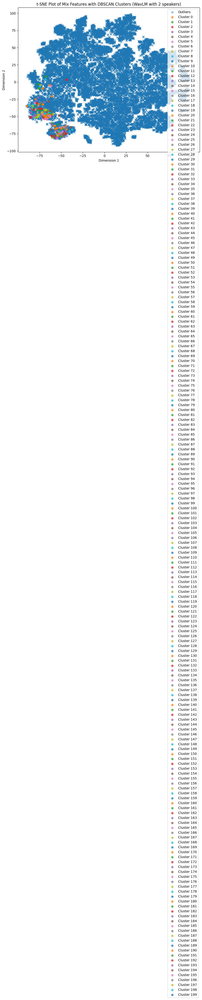

In [47]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot with DBSCAN clusters
plt.figure(figsize=(10, 8))



# Identify core samples and outliers
core_samples_mask = np.zeros_like(mix_cluster_labels, dtype=bool)
core_samples_mask[dbscan.core_sample_indices_] = True
outliers_mask = (mix_cluster_labels == -1) & ~core_samples_mask

outliers = mix_features_tsne[outliers_mask]
plt.scatter(outliers[:, 0], outliers[:, 1], marker='x', label='Outliers', alpha=0.7)

# Plot core samples with different colors for each cluster
for label in set(mix_cluster_labels):
    if label != -1:
        cluster_points = mix_features_tsne[mix_cluster_labels == label]
        plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {label}', alpha=0.7)

# Plot outliers with a different marker


plt.title('t-SNE Plot of Mix Features with DBSCAN Clusters (WavLM with 2 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.savefig(save_path + '\WavLM with 2 speakers DBSCAN.png')
plt.show()


In [48]:
from sklearn.mixture import GaussianMixture
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

# Assuming source_features_np contains true labels
true_labels = source_features_np.flatten()

# Reshape true_labels to match the shape of mix_features_np
true_labels = true_labels[:len(mix_features_np)]

# Apply Gaussian Mixture Model clustering to mix features
num_components = 2  # Adjust based on your use case
gmm = GaussianMixture(n_components=num_components)
mix_cluster_labels = gmm.fit_predict(mix_features_np)

# Evaluate various metrics for GMM
ari = adjusted_rand_score(true_labels, mix_cluster_labels)
nmi = normalized_mutual_info_score(true_labels, mix_cluster_labels)
silhouette = silhouette_score(mix_features_np, mix_cluster_labels)
calinski_harabasz = calinski_harabasz_score(mix_features_np, mix_cluster_labels)
davies_bouldin = davies_bouldin_score(mix_features_np, mix_cluster_labels)

# Print the metrics for GMM
print("Gaussian Mixture Model:")
print(f"Adjusted Rand Index (ARI): {ari}")
print(f"Normalized Mutual Information (NMI): {nmi}")
print(f"Silhouette Score: {silhouette}")
print(f"Calinski-Harabasz Index: {calinski_harabasz}")
print(f"Davies-Bouldin Index: {davies_bouldin}")


C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and binary values for target
  warnings.warn(msg, UserWarning)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and binary values for target
  warnings.warn(msg, UserWarning)


Gaussian Mixture Model:
Adjusted Rand Index (ARI): -2.343818590540046e-08
Normalized Mutual Information (NMI): 0.1251468478250153
Silhouette Score: 0.10667931288480759
Calinski-Harabasz Index: 2871.09789855471
Davies-Bouldin Index: 2.9590204072929196


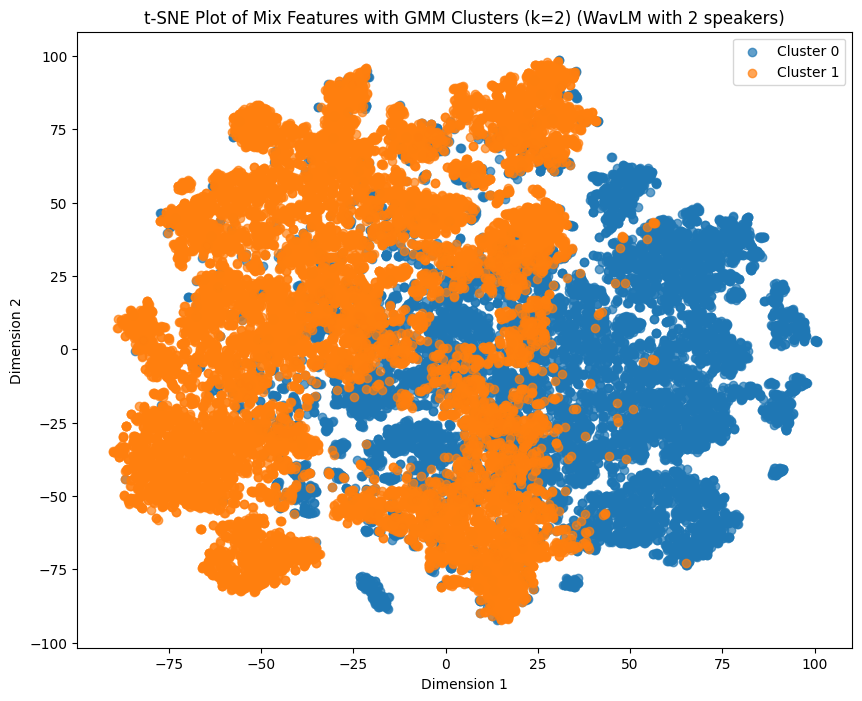

In [49]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot with cluster colors
plt.figure(figsize=(10, 8))
for cluster_label in range(num_components):
    cluster_points = mix_features_tsne[mix_cluster_labels == cluster_label]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {cluster_label}', alpha=0.7)

plt.title('t-SNE Plot of Mix Features with GMM Clusters (k=2) (WavLM with 2 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.savefig(save_path + '\WavLM with 2 speakers k=2 GMM.png')
plt.show()


WavLM with 3 speakers

In [50]:
import torch
from torch import nn
from sklearn.metrics import davies_bouldin_score
from transformers import WavLMForCTC, Wav2Vec2Processor

# Define Wav2Vec 2.0 model and processor
processor = Wav2Vec2Processor.from_pretrained("facebook/wav2vec2-base-960h")
model = WavLMForCTC.from_pretrained("patrickvonplaten/wavlm-libri-clean-100h-base")

# Move the model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Freeze the parameters of the Wav2Vec 2.0 model
for param in model.parameters():
    param.requires_grad = False

# Define your clustering model

# Define your training data
# Replace this with your actual training data loading logic
sampling_rate = 16000  # Adjust based on your data

# Feature extraction and clustering
mix_features_list = []
source_features_list = []

for _, mix_waveform, source_waveforms in train_set_3:
    # Feature extraction using Wav2Vec 2.0 for mix waveform
    mix_input_values = processor(mix_waveform, return_tensors="pt", padding="longest", sampling_rate=16000).input_values.squeeze().to(device)
    mix_outputs = model(mix_input_values.unsqueeze(0))
    mix_logits = mix_outputs.logits.squeeze().detach().cpu()
    mix_features_list.append(mix_logits)

    # Feature extraction using Wav2Vec 2.0 for each source waveform
    for source_waveform in source_waveforms:
        source_input_values = processor(source_waveform, return_tensors="pt", padding="longest", sampling_rate=16000).input_values.squeeze().to(device)
        source_outputs = model(source_input_values.unsqueeze(0))
        source_logits = source_outputs.logits.squeeze().detach().cpu()
        source_features_list.append(source_logits)

# Convert features to numpy arrays
mix_features_np = torch.cat(mix_features_list).detach()
source_features_np = torch.cat(source_features_list).detach()

# Convert features to numpy arrays and move them back to CPU
mix_features_np = mix_features_np.cpu().numpy()
source_features_np = source_features_np.cpu().numpy()


# Rest of your code for clustering and evaluation


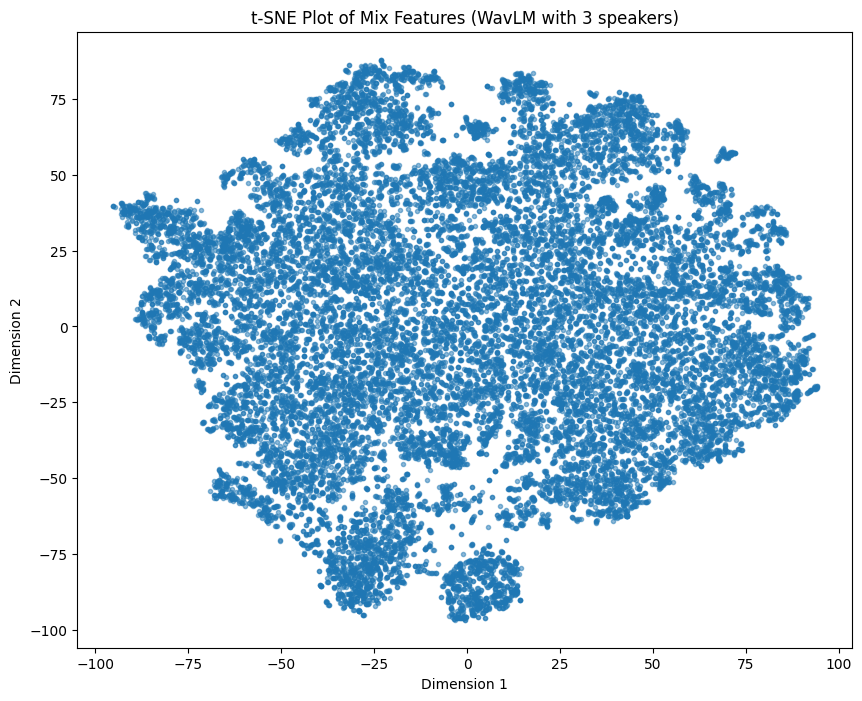

In [51]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot
plt.figure(figsize=(10, 8))
plt.scatter(mix_features_tsne[:, 0], mix_features_tsne[:, 1], marker='.', alpha=0.5)
plt.title('t-SNE Plot of Mix Features (WavLM with 3 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.savefig(save_path + '\WavLM with 3 speakers.png')
plt.show()


In [52]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, silhouette_score, calinski_harabasz_score, davies_bouldin_score, pairwise_distances

# Assuming source_features_np contains true labels
true_labels = source_features_np.flatten()

# Reshape true_labels to match the shape of mix_features_np
true_labels = true_labels[:len(mix_features_np)]

# Apply KMeans clustering to mix features
num_clusters = 3  # Adjust based on your use case
kmeans = KMeans(n_clusters=num_clusters, random_state=0)

# Fit KMeans to mix features
mix_cluster_labels = kmeans.fit_predict(mix_features_np)

# Evaluate various metrics
ari = adjusted_rand_score(true_labels, mix_cluster_labels)
nmi = normalized_mutual_info_score(true_labels, mix_cluster_labels)
silhouette = silhouette_score(mix_features_np, mix_cluster_labels)
calinski_harabasz = calinski_harabasz_score(mix_features_np, mix_cluster_labels)
davies_bouldin = davies_bouldin_score(mix_features_np, mix_cluster_labels)
avg_silhouette = silhouette.mean()

# Print the metrics
print(f"Adjusted Rand Index: {ari}")
print(f"Normalized Mutual Information: {nmi}")
print(f"Silhouette Score: {silhouette}")
print(f"Average Silhouette Score: {avg_silhouette}")
print(f"Calinski-Harabasz Index: {calinski_harabasz}")
print(f"Davies-Bouldin Index: {davies_bouldin}")


C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)


Adjusted Rand Index: -2.6880576965193683e-09
Normalized Mutual Information: 0.18480880625419038
Silhouette Score: 0.1904999166727066
Average Silhouette Score: 0.1904999166727066
Calinski-Harabasz Index: 5020.509957323762
Davies-Bouldin Index: 1.6595954338915302


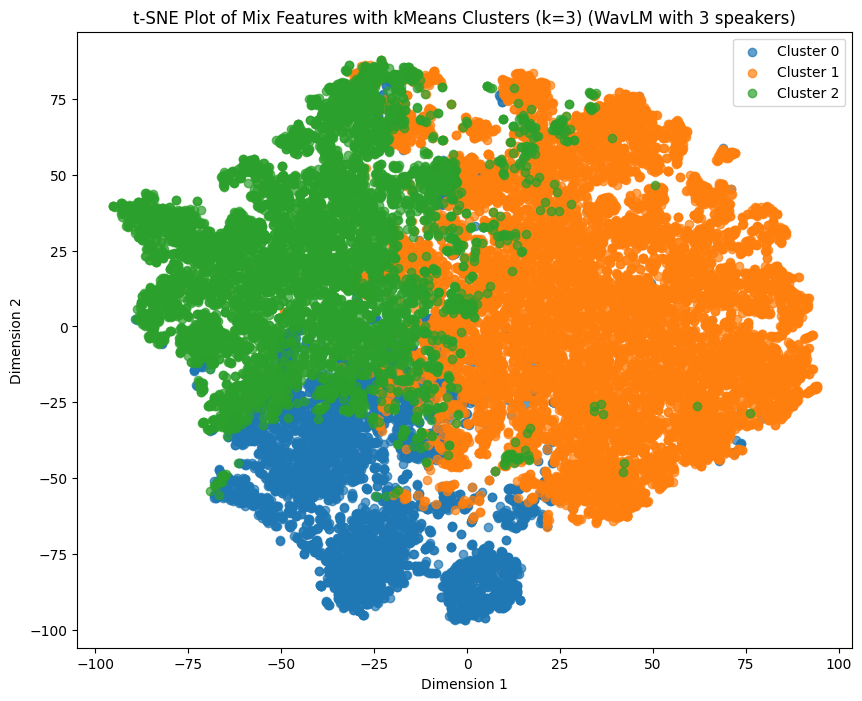

In [53]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot with cluster colors
plt.figure(figsize=(10, 8))
for cluster_label in range(num_clusters):
    cluster_points = mix_features_tsne[mix_cluster_labels == cluster_label]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {cluster_label}', alpha=0.7)

plt.title('t-SNE Plot of Mix Features with kMeans Clusters (k=3) (WavLM with 3 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.savefig(save_path + '\WavLM with 3 speakers k=3 KMeans.png')
plt.show()


In [54]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, silhouette_score, calinski_harabasz_score, davies_bouldin_score, pairwise_distances

# Assuming source_features_np contains true labels
true_labels = source_features_np.flatten()

# Reshape true_labels to match the shape of mix_features_np
true_labels = true_labels[:len(mix_features_np)]

# Apply KMeans clustering to mix features
num_clusters = 4  # Adjust based on your use case
kmeans = KMeans(n_clusters=num_clusters, random_state=0)

# Fit KMeans to mix features
mix_cluster_labels = kmeans.fit_predict(mix_features_np)

# Evaluate various metrics
ari = adjusted_rand_score(true_labels, mix_cluster_labels)
nmi = normalized_mutual_info_score(true_labels, mix_cluster_labels)
silhouette = silhouette_score(mix_features_np, mix_cluster_labels)
calinski_harabasz = calinski_harabasz_score(mix_features_np, mix_cluster_labels)
davies_bouldin = davies_bouldin_score(mix_features_np, mix_cluster_labels)
avg_silhouette = silhouette.mean()

# Print the metrics
print(f"Adjusted Rand Index: {ari}")
print(f"Normalized Mutual Information: {nmi}")
print(f"Silhouette Score: {silhouette}")
print(f"Average Silhouette Score: {avg_silhouette}")
print(f"Calinski-Harabasz Index: {calinski_harabasz}")
print(f"Davies-Bouldin Index: {davies_bouldin}")


C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)


Adjusted Rand Index: -2.0909059575335358e-08
Normalized Mutual Information: 0.2401051967733066
Silhouette Score: 0.17982594668865204
Average Silhouette Score: 0.17982594668865204
Calinski-Harabasz Index: 4476.773934711086
Davies-Bouldin Index: 1.9022134011648055


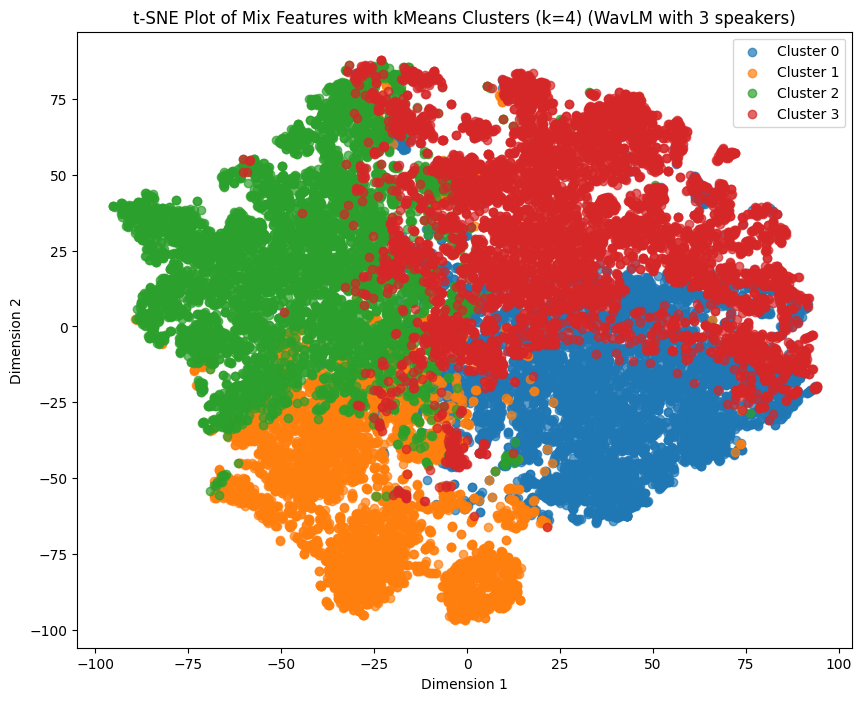

In [55]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot with cluster colors
plt.figure(figsize=(10, 8))
for cluster_label in range(num_clusters):
    cluster_points = mix_features_tsne[mix_cluster_labels == cluster_label]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {cluster_label}', alpha=0.7)

plt.title('t-SNE Plot of Mix Features with kMeans Clusters (k=4) (WavLM with 3 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.savefig(save_path + '\WavLM with 3 speakers k=4 KMeans.png')
plt.show()


In [56]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, silhouette_score, calinski_harabasz_score

# Assuming source_features_np contains true labels
true_labels = source_features_np.flatten()

# Reshape true_labels to match the shape of mix_features_np
true_labels = true_labels[:len(mix_features_np)]

# Apply Agglomerative Clustering to mix features
num_clusters = 3  # Adjust based on your use case
agglo = AgglomerativeClustering(n_clusters=num_clusters)
mix_cluster_labels = agglo.fit_predict(mix_features_np)

# Evaluate various metrics for Agglomerative Clustering
ari = adjusted_rand_score(true_labels, mix_cluster_labels)
nmi = normalized_mutual_info_score(true_labels, mix_cluster_labels)
silhouette = silhouette_score(mix_features_np, mix_cluster_labels)
calinski_harabasz = calinski_harabasz_score(mix_features_np, mix_cluster_labels)
davies_bouldin = davies_bouldin_score(mix_features_np, mix_cluster_labels)

# Print the metrics for Agglomerative Clustering
print("Agglomerative Clustering:")
print(f"Adjusted Rand Index (ARI): {ari}")
print(f"Normalized Mutual Information (NMI): {nmi}")
print(f"Silhouette Score: {silhouette}")
print(f"Calinski-Harabasz Index: {calinski_harabasz}")
print(f"Davies-Bouldin Index: {davies_bouldin}")


C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)


Agglomerative Clustering:
Adjusted Rand Index (ARI): 1.2174577841873856e-08
Normalized Mutual Information (NMI): 0.17576570976525546
Silhouette Score: 0.1597522497177124
Calinski-Harabasz Index: 4064.2495368442624
Davies-Bouldin Index: 1.774619037320303


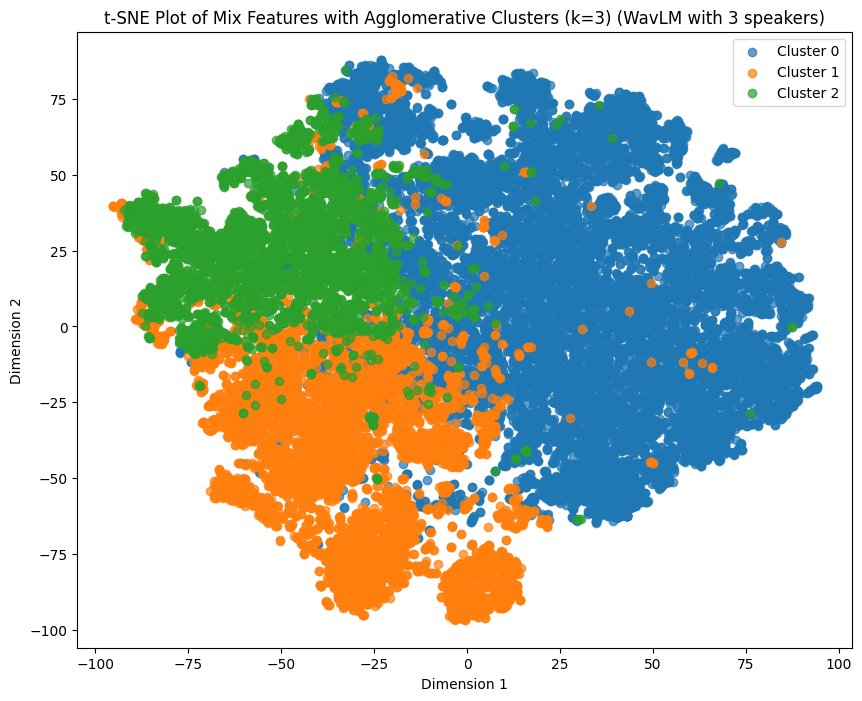

In [57]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot with cluster colors
plt.figure(figsize=(10, 8))
for cluster_label in range(num_clusters):
    cluster_points = mix_features_tsne[mix_cluster_labels == cluster_label]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {cluster_label}', alpha=0.7)

plt.title('t-SNE Plot of Mix Features with Agglomerative Clusters (k=3) (WavLM with 3 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.savefig(save_path + '\WavLM with 3 speakers k=3 Agglomerative.png')
plt.show()


In [58]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

# Assuming source_features_np contains true labels
true_labels = source_features_np.flatten()

# Reshape true_labels to match the shape of mix_features_np
true_labels = true_labels[:len(mix_features_np)]

# Apply DBSCAN clustering to mix features
eps = 0.5  # Adjust based on your use case
min_samples = 2  # Adjust based on your use case
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
mix_cluster_labels = dbscan.fit_predict(mix_features_np)

# Evaluate various metrics for DBSCAN
ari = adjusted_rand_score(true_labels, mix_cluster_labels)
nmi = normalized_mutual_info_score(true_labels, mix_cluster_labels)
silhouette = silhouette_score(mix_features_np, mix_cluster_labels)
calinski_harabasz = calinski_harabasz_score(mix_features_np, mix_cluster_labels)
davies_bouldin = davies_bouldin_score(mix_features_np, mix_cluster_labels)

# Print the metrics for DBSCAN
print("DBSCAN:")
print(f"Adjusted Rand Index (ARI): {ari}")
print(f"Normalized Mutual Information (NMI): {nmi}")
print(f"Silhouette Score: {silhouette}")
print(f"Calinski-Harabasz Index: {calinski_harabasz}")
print(f"Davies-Bouldin Index: {davies_bouldin}")


C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)


DBSCAN:
Adjusted Rand Index (ARI): 4.091242803805256e-10
Normalized Mutual Information (NMI): 0.019288701911513027
Silhouette Score: -0.0672886073589325
Calinski-Harabasz Index: 2.791198266150013
Davies-Bouldin Index: 0.9152021361197165


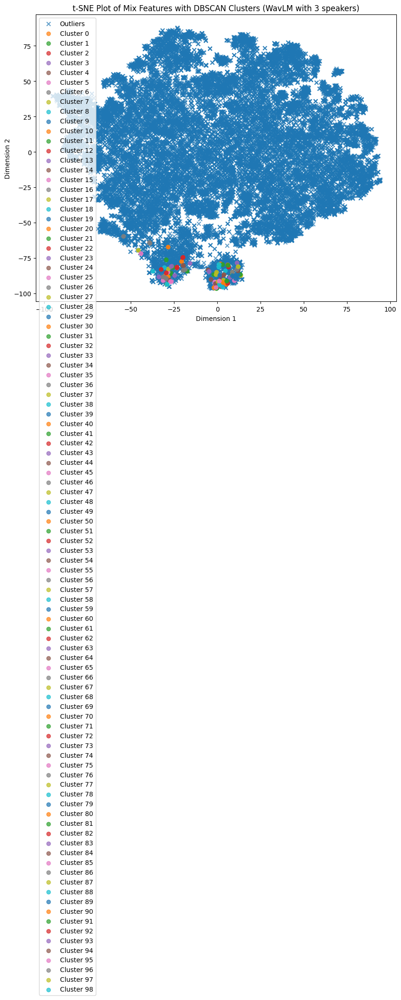

In [59]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot with DBSCAN clusters
plt.figure(figsize=(10, 8))



# Identify core samples and outliers
core_samples_mask = np.zeros_like(mix_cluster_labels, dtype=bool)
core_samples_mask[dbscan.core_sample_indices_] = True
outliers_mask = (mix_cluster_labels == -1) & ~core_samples_mask

outliers = mix_features_tsne[outliers_mask]
plt.scatter(outliers[:, 0], outliers[:, 1], marker='x', label='Outliers', alpha=0.7)

# Plot core samples with different colors for each cluster
for label in set(mix_cluster_labels):
    if label != -1:
        cluster_points = mix_features_tsne[mix_cluster_labels == label]
        plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {label}', alpha=0.7)

# Plot outliers with a different marker


plt.title('t-SNE Plot of Mix Features with DBSCAN Clusters (WavLM with 3 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.savefig(save_path + '\WavLM with 3 speakers DBSCAN.png')
plt.show()


In [60]:
from sklearn.mixture import GaussianMixture
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

# Assuming source_features_np contains true labels
true_labels = source_features_np.flatten()

# Reshape true_labels to match the shape of mix_features_np
true_labels = true_labels[:len(mix_features_np)]

# Apply Gaussian Mixture Model clustering to mix features
num_components = 3  # Adjust based on your use case
gmm = GaussianMixture(n_components=num_components)
mix_cluster_labels = gmm.fit_predict(mix_features_np)

# Evaluate various metrics for GMM
ari = adjusted_rand_score(true_labels, mix_cluster_labels)
nmi = normalized_mutual_info_score(true_labels, mix_cluster_labels)
silhouette = silhouette_score(mix_features_np, mix_cluster_labels)
calinski_harabasz = calinski_harabasz_score(mix_features_np, mix_cluster_labels)
davies_bouldin = davies_bouldin_score(mix_features_np, mix_cluster_labels)

# Print the metrics for GMM
print("Gaussian Mixture Model:")
print(f"Adjusted Rand Index (ARI): {ari}")
print(f"Normalized Mutual Information (NMI): {nmi}")
print(f"Silhouette Score: {silhouette}")
print(f"Calinski-Harabasz Index: {calinski_harabasz}")
print(f"Davies-Bouldin Index: {davies_bouldin}")


C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)


Gaussian Mixture Model:
Adjusted Rand Index (ARI): -1.5656024642119804e-09
Normalized Mutual Information (NMI): 0.18932534791323788
Silhouette Score: 0.11053620278835297
Calinski-Harabasz Index: 2698.74030025444
Davies-Bouldin Index: 3.268256465906271


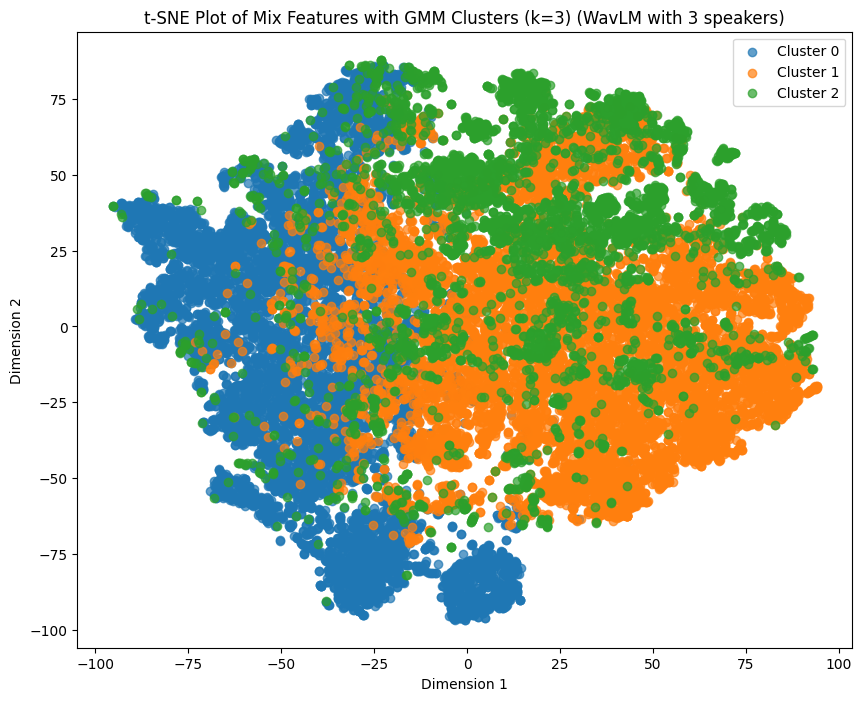

In [61]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot with cluster colors
plt.figure(figsize=(10, 8))
for cluster_label in range(num_components):
    cluster_points = mix_features_tsne[mix_cluster_labels == cluster_label]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {cluster_label}', alpha=0.7)

plt.title('t-SNE Plot of Mix Features with GMM Clusters (k=3) (WavLM with 3 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.savefig(save_path + '\WavLM with 3 speakers k=3 GMM.png')
plt.show()


HuBERT with 2 speakers

In [62]:
import torch
from torch import nn
from sklearn.metrics import davies_bouldin_score
from transformers import AutoProcessor, HubertForCTC

# Define Wav2Vec 2.0 model and processor
processor = AutoProcessor.from_pretrained("facebook/hubert-large-ls960-ft")
model = HubertForCTC.from_pretrained("facebook/hubert-large-ls960-ft")

# Move the model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Freeze the parameters of the Wav2Vec 2.0 model
for param in model.parameters():
    param.requires_grad = False

# Define your clustering model

# Define your training data
# Replace this with your actual training data loading logic
sampling_rate = 16000  # Adjust based on your data

# Feature extraction and clustering
mix_features_list = []
source_features_list = []

for _, mix_waveform, source_waveforms in train_set:
    # Feature extraction using Wav2Vec 2.0 for mix waveform
    mix_input_values = processor(mix_waveform, return_tensors="pt", padding="longest", sampling_rate=16000).input_values.squeeze().to(device)
    mix_outputs = model(mix_input_values.unsqueeze(0))
    mix_logits = mix_outputs.logits.squeeze().detach().cpu()
    mix_features_list.append(mix_logits)

    # Feature extraction using Wav2Vec 2.0 for each source waveform
    for source_waveform in source_waveforms:
        source_input_values = processor(source_waveform, return_tensors="pt", padding="longest", sampling_rate=16000).input_values.squeeze().to(device)
        source_outputs = model(source_input_values.unsqueeze(0))
        source_logits = source_outputs.logits.squeeze().detach().cpu()
        source_features_list.append(source_logits)

# Convert features to numpy arrays
mix_features_np = torch.cat(mix_features_list).detach()
source_features_np = torch.cat(source_features_list).detach()

# Convert features to numpy arrays and move them back to CPU
mix_features_np = mix_features_np.cpu().numpy()
source_features_np = source_features_np.cpu().numpy()


# Rest of your code for clustering and evaluation


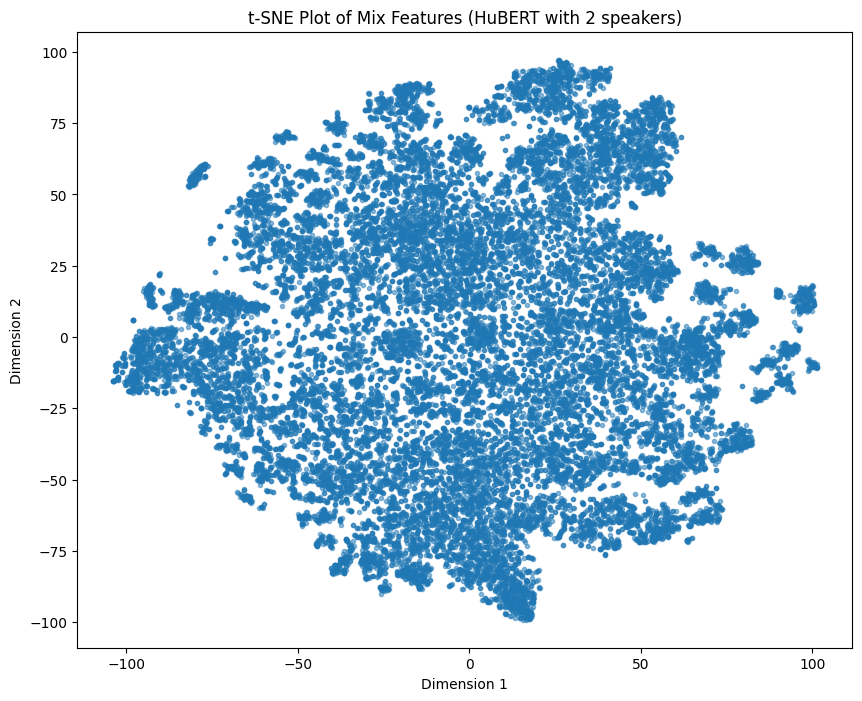

In [63]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot
plt.figure(figsize=(10, 8))
plt.scatter(mix_features_tsne[:, 0], mix_features_tsne[:, 1], marker='.', alpha=0.5)
plt.title('t-SNE Plot of Mix Features (HuBERT with 2 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.savefig(save_path + '\HuBERT with 2 speakers.png')
plt.show()


In [64]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, silhouette_score, calinski_harabasz_score, davies_bouldin_score, pairwise_distances

# Assuming source_features_np contains true labels
true_labels = source_features_np.flatten()

# Reshape true_labels to match the shape of mix_features_np
true_labels = true_labels[:len(mix_features_np)]

# Apply KMeans clustering to mix features
num_clusters = 3  # Adjust based on your use case
kmeans = KMeans(n_clusters=num_clusters, random_state=0)

# Fit KMeans to mix features
mix_cluster_labels = kmeans.fit_predict(mix_features_np)

# Evaluate various metrics
ari = adjusted_rand_score(true_labels, mix_cluster_labels)
nmi = normalized_mutual_info_score(true_labels, mix_cluster_labels)
silhouette = silhouette_score(mix_features_np, mix_cluster_labels)
calinski_harabasz = calinski_harabasz_score(mix_features_np, mix_cluster_labels)
davies_bouldin = davies_bouldin_score(mix_features_np, mix_cluster_labels)
avg_silhouette = silhouette.mean()

# Print the metrics
print(f"Adjusted Rand Index: {ari}")
print(f"Normalized Mutual Information: {nmi}")
print(f"Silhouette Score: {silhouette}")
print(f"Average Silhouette Score: {avg_silhouette}")
print(f"Calinski-Harabasz Index: {calinski_harabasz}")
print(f"Davies-Bouldin Index: {davies_bouldin}")


C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)


Adjusted Rand Index: 1.3075917219774293e-08
Normalized Mutual Information: 0.17352707855142335
Silhouette Score: 0.20401102304458618
Average Silhouette Score: 0.20401102304458618
Calinski-Harabasz Index: 6660.790063888264
Davies-Bouldin Index: 1.5654318386849104


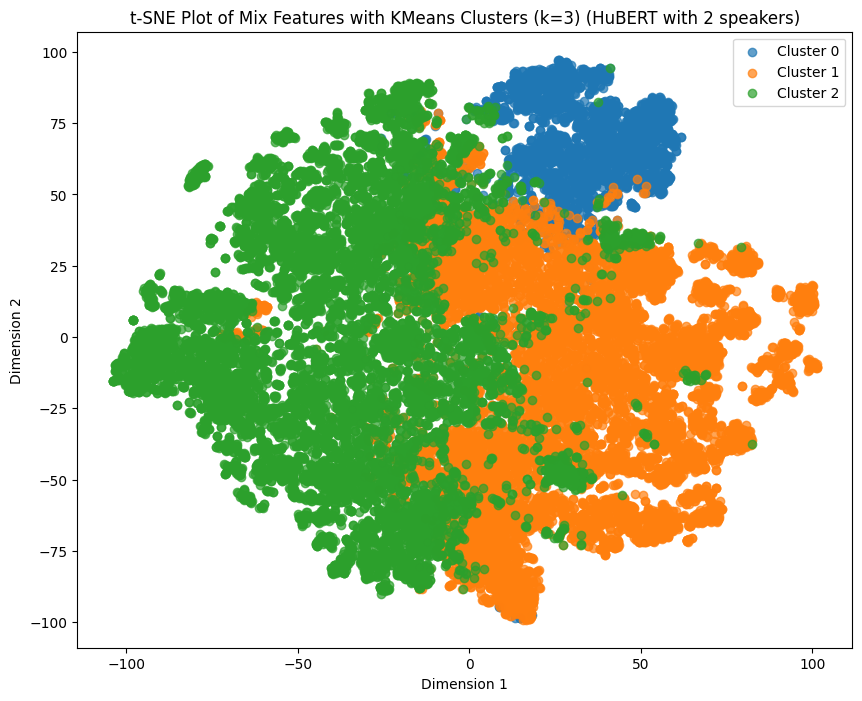

In [65]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot with cluster colors
plt.figure(figsize=(10, 8))
for cluster_label in range(num_clusters):
    cluster_points = mix_features_tsne[mix_cluster_labels == cluster_label]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {cluster_label}', alpha=0.7)

plt.title('t-SNE Plot of Mix Features with KMeans Clusters (k=3) (HuBERT with 2 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.savefig(save_path + '\HuBERT with 2 speakers k=3 KMeans.png')
plt.show()


In [66]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, silhouette_score, calinski_harabasz_score, davies_bouldin_score, pairwise_distances

# Assuming source_features_np contains true labels
true_labels = source_features_np.flatten()

# Reshape true_labels to match the shape of mix_features_np
true_labels = true_labels[:len(mix_features_np)]

# Apply KMeans clustering to mix features
num_clusters = 2  # Adjust based on your use case
kmeans = KMeans(n_clusters=num_clusters, random_state=0)

# Fit KMeans to mix features
mix_cluster_labels = kmeans.fit_predict(mix_features_np)

# Evaluate various metrics
ari = adjusted_rand_score(true_labels, mix_cluster_labels)
nmi = normalized_mutual_info_score(true_labels, mix_cluster_labels)
silhouette = silhouette_score(mix_features_np, mix_cluster_labels)
calinski_harabasz = calinski_harabasz_score(mix_features_np, mix_cluster_labels)
davies_bouldin = davies_bouldin_score(mix_features_np, mix_cluster_labels)
avg_silhouette = silhouette.mean()

# Print the metrics
print(f"Adjusted Rand Index: {ari}")
print(f"Normalized Mutual Information: {nmi}")
print(f"Silhouette Score: {silhouette}")
print(f"Average Silhouette Score: {avg_silhouette}")
print(f"Calinski-Harabasz Index: {calinski_harabasz}")
print(f"Davies-Bouldin Index: {davies_bouldin}")


C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and binary values for target
  warnings.warn(msg, UserWarning)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and binary values for target
  warnings.warn(msg, UserWarning)


Adjusted Rand Index: 5.2177375583199926e-09
Normalized Mutual Information: 0.12655777933737436
Silhouette Score: 0.18415337800979614
Average Silhouette Score: 0.18415337800979614
Calinski-Harabasz Index: 7459.918488851924
Davies-Bouldin Index: 1.8002465930264084


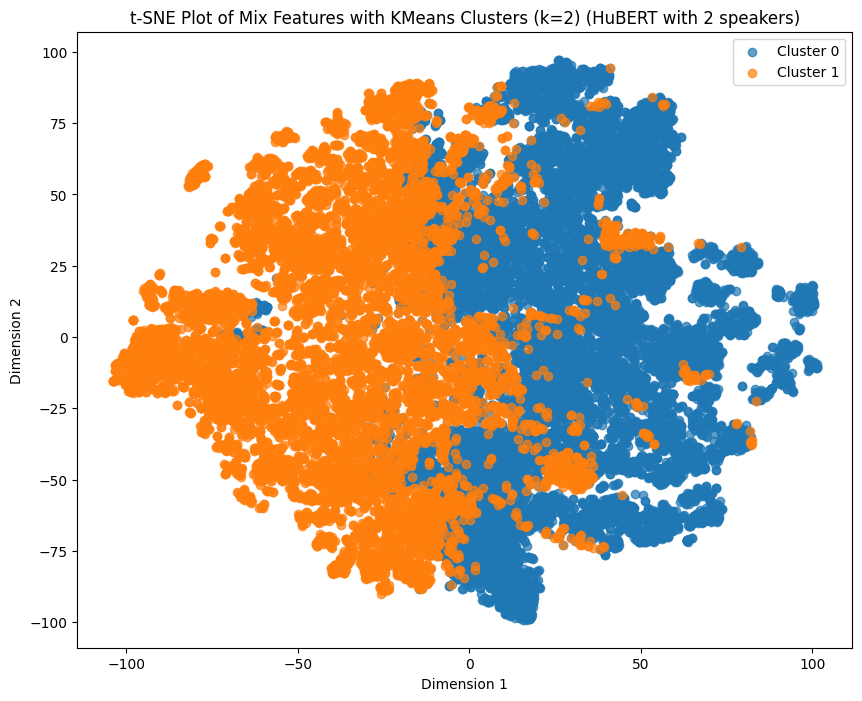

In [67]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot with cluster colors
plt.figure(figsize=(10, 8))
for cluster_label in range(num_clusters):
    cluster_points = mix_features_tsne[mix_cluster_labels == cluster_label]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {cluster_label}', alpha=0.7)

plt.title('t-SNE Plot of Mix Features with KMeans Clusters (k=2) (HuBERT with 2 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.savefig(save_path + '\HuBERT with 2 speakers k=2 KMeans.png')
plt.show()


In [68]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, silhouette_score, calinski_harabasz_score

# Assuming source_features_np contains true labels
true_labels = source_features_np.flatten()

# Reshape true_labels to match the shape of mix_features_np
true_labels = true_labels[:len(mix_features_np)]

# Apply Agglomerative Clustering to mix features
num_clusters = 2  # Adjust based on your use case
agglo = AgglomerativeClustering(n_clusters=num_clusters)
mix_cluster_labels = agglo.fit_predict(mix_features_np)

# Evaluate various metrics for Agglomerative Clustering
ari = adjusted_rand_score(true_labels, mix_cluster_labels)
nmi = normalized_mutual_info_score(true_labels, mix_cluster_labels)
silhouette = silhouette_score(mix_features_np, mix_cluster_labels)
calinski_harabasz = calinski_harabasz_score(mix_features_np, mix_cluster_labels)
davies_bouldin = davies_bouldin_score(mix_features_np, mix_cluster_labels)

# Print the metrics for Agglomerative Clustering
print("Agglomerative Clustering:")
print(f"Adjusted Rand Index (ARI): {ari}")
print(f"Normalized Mutual Information (NMI): {nmi}")
print(f"Silhouette Score: {silhouette}")
print(f"Calinski-Harabasz Index: {calinski_harabasz}")
print(f"Davies-Bouldin Index: {davies_bouldin}")


C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and binary values for target
  warnings.warn(msg, UserWarning)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and binary values for target
  warnings.warn(msg, UserWarning)


Agglomerative Clustering:
Adjusted Rand Index (ARI): 1.3939076166672262e-08
Normalized Mutual Information (NMI): 0.12211388371172285
Silhouette Score: 0.1383482813835144
Calinski-Harabasz Index: 5255.925195557419
Davies-Bouldin Index: 2.056508824261739


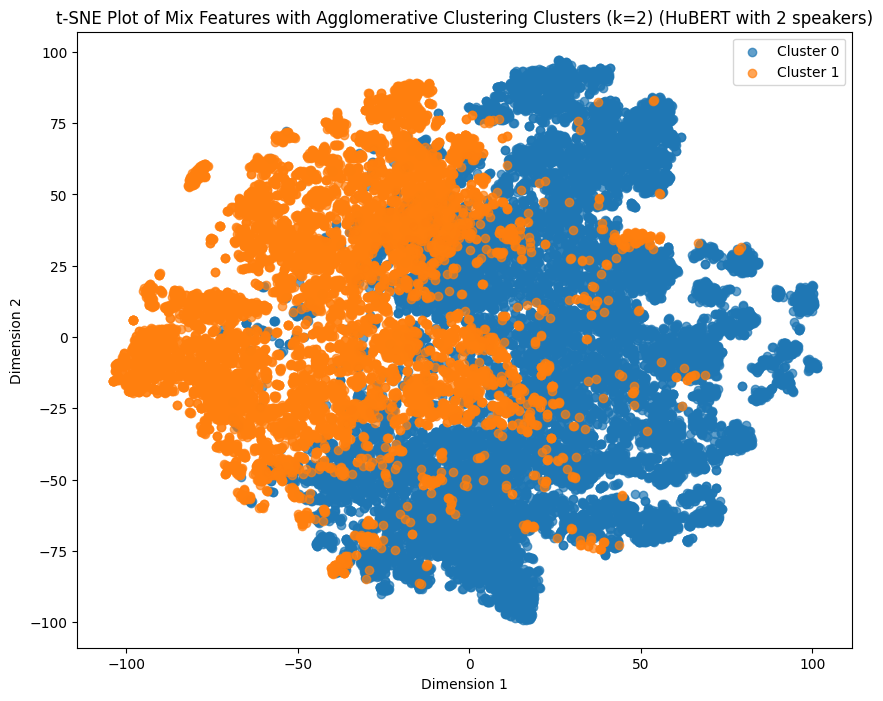

In [69]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot with cluster colors
plt.figure(figsize=(10, 8))
for cluster_label in range(num_clusters):
    cluster_points = mix_features_tsne[mix_cluster_labels == cluster_label]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {cluster_label}', alpha=0.7)

plt.title('t-SNE Plot of Mix Features with Agglomerative Clustering Clusters (k=2) (HuBERT with 2 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.savefig(save_path + '\HuBERT with 2 speakers k=2 Agglomerative.png')
plt.show()


In [70]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

# Assuming source_features_np contains true labels
true_labels = source_features_np.flatten()

# Reshape true_labels to match the shape of mix_features_np
true_labels = true_labels[:len(mix_features_np)]

# Apply DBSCAN clustering to mix features
eps = 0.5  # Adjust based on your use case
min_samples = 2  # Adjust based on your use case
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
mix_cluster_labels = dbscan.fit_predict(mix_features_np)

# Evaluate various metrics for DBSCAN
ari = adjusted_rand_score(true_labels, mix_cluster_labels)
nmi = normalized_mutual_info_score(true_labels, mix_cluster_labels)
silhouette = silhouette_score(mix_features_np, mix_cluster_labels)
calinski_harabasz = calinski_harabasz_score(mix_features_np, mix_cluster_labels)
davies_bouldin = davies_bouldin_score(mix_features_np, mix_cluster_labels)

# Print the metrics for DBSCAN
print("DBSCAN:")
print(f"Adjusted Rand Index (ARI): {ari}")
print(f"Normalized Mutual Information (NMI): {nmi}")
print(f"Silhouette Score: {silhouette}")
print(f"Calinski-Harabasz Index: {calinski_harabasz}")
print(f"Davies-Bouldin Index: {davies_bouldin}")


C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)


DBSCAN:
Adjusted Rand Index (ARI): 1.20498851941216e-11
Normalized Mutual Information (NMI): 0.0004558500420117943
Silhouette Score: -0.2466599941253662
Calinski-Harabasz Index: 0.8171374632680438
Davies-Bouldin Index: 1.652470550626109


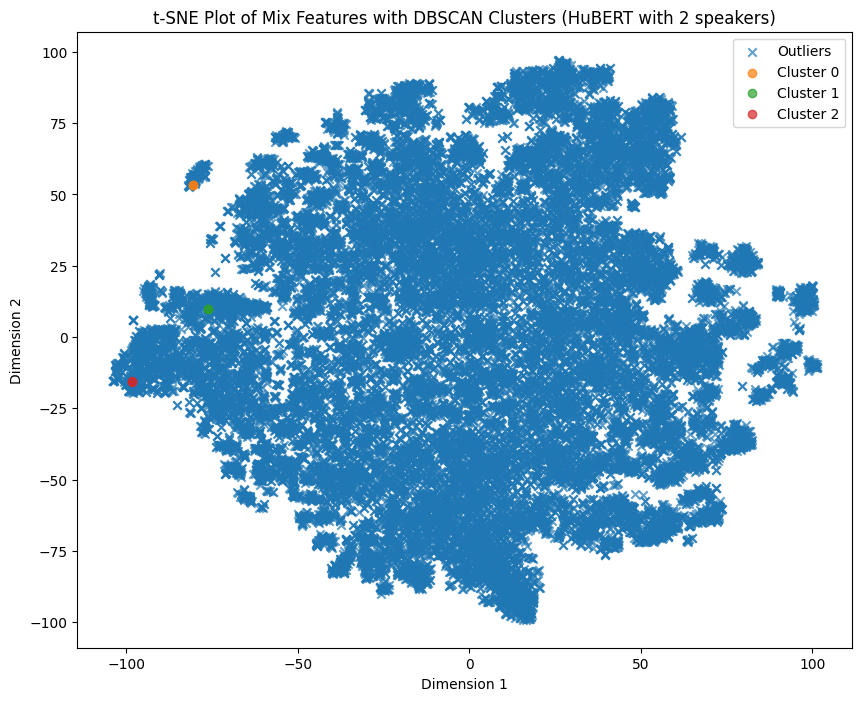

In [71]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot with DBSCAN clusters
plt.figure(figsize=(10, 8))



# Identify core samples and outliers
core_samples_mask = np.zeros_like(mix_cluster_labels, dtype=bool)
core_samples_mask[dbscan.core_sample_indices_] = True
outliers_mask = (mix_cluster_labels == -1) & ~core_samples_mask

outliers = mix_features_tsne[outliers_mask]
plt.scatter(outliers[:, 0], outliers[:, 1], marker='x', label='Outliers', alpha=0.7)

# Plot core samples with different colors for each cluster
for label in set(mix_cluster_labels):
    if label != -1:
        cluster_points = mix_features_tsne[mix_cluster_labels == label]
        plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {label}', alpha=0.7)

# Plot outliers with a different marker


plt.title('t-SNE Plot of Mix Features with DBSCAN Clusters (HuBERT with 2 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.savefig(save_path + '\HuBERT with 2 speakers DBSCAN.png')
plt.show()


In [72]:
from sklearn.mixture import GaussianMixture
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

# Assuming source_features_np contains true labels
true_labels = source_features_np.flatten()

# Reshape true_labels to match the shape of mix_features_np
true_labels = true_labels[:len(mix_features_np)]

# Apply Gaussian Mixture Model clustering to mix features
num_components = 2  # Adjust based on your use case
gmm = GaussianMixture(n_components=num_components)
mix_cluster_labels = gmm.fit_predict(mix_features_np)

# Evaluate various metrics for GMM
ari = adjusted_rand_score(true_labels, mix_cluster_labels)
nmi = normalized_mutual_info_score(true_labels, mix_cluster_labels)
silhouette = silhouette_score(mix_features_np, mix_cluster_labels)
calinski_harabasz = calinski_harabasz_score(mix_features_np, mix_cluster_labels)
davies_bouldin = davies_bouldin_score(mix_features_np, mix_cluster_labels)

# Print the metrics for GMM
print("Gaussian Mixture Model:")
print(f"Adjusted Rand Index (ARI): {ari}")
print(f"Normalized Mutual Information (NMI): {nmi}")
print(f"Silhouette Score: {silhouette}")
print(f"Calinski-Harabasz Index: {calinski_harabasz}")
print(f"Davies-Bouldin Index: {davies_bouldin}")


C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and binary values for target
  warnings.warn(msg, UserWarning)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and binary values for target
  warnings.warn(msg, UserWarning)


Gaussian Mixture Model:
Adjusted Rand Index (ARI): -5.4741713105914116e-09
Normalized Mutual Information (NMI): 0.12702097200245957
Silhouette Score: 0.04866243153810501
Calinski-Harabasz Index: 875.0091569286252
Davies-Bouldin Index: 5.191017797994095


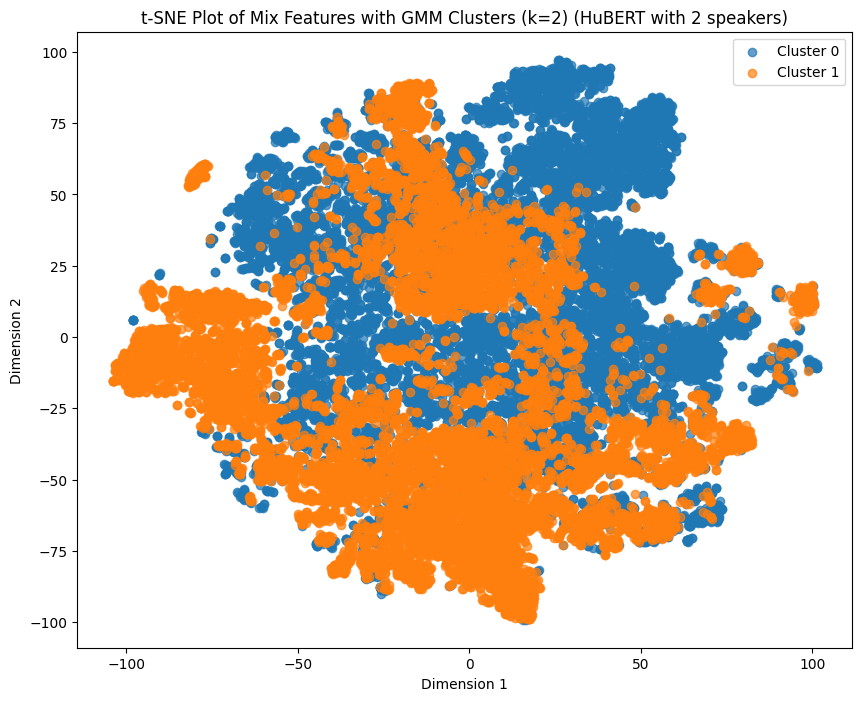

In [73]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot with cluster colors
plt.figure(figsize=(10, 8))
for cluster_label in range(num_components):
    cluster_points = mix_features_tsne[mix_cluster_labels == cluster_label]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {cluster_label}', alpha=0.7)

plt.title('t-SNE Plot of Mix Features with GMM Clusters (k=2) (HuBERT with 2 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.savefig(save_path + '\HuBERT with 2 speakers k=2 GMM.png')
plt.show()


HuBERT with 3 speakers

In [74]:
import torch
from torch import nn
from sklearn.metrics import davies_bouldin_score
from transformers import AutoProcessor, HubertForCTC

# Define Wav2Vec 2.0 model and processor
processor = AutoProcessor.from_pretrained("facebook/hubert-large-ls960-ft")
model = HubertForCTC.from_pretrained("facebook/hubert-large-ls960-ft")

# Move the model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Freeze the parameters of the Wav2Vec 2.0 model
for param in model.parameters():
    param.requires_grad = False

# Define your clustering model

# Define your training data
# Replace this with your actual training data loading logic
sampling_rate = 16000  # Adjust based on your data

# Feature extraction and clustering
mix_features_list = []
source_features_list = []

for _, mix_waveform, source_waveforms in train_set_3:
    # Feature extraction using Wav2Vec 2.0 for mix waveform
    mix_input_values = processor(mix_waveform, return_tensors="pt", padding="longest", sampling_rate=16000).input_values.squeeze().to(device)
    mix_outputs = model(mix_input_values.unsqueeze(0))
    mix_logits = mix_outputs.logits.squeeze().detach().cpu()
    mix_features_list.append(mix_logits)

    # Feature extraction using Wav2Vec 2.0 for each source waveform
    for source_waveform in source_waveforms:
        source_input_values = processor(source_waveform, return_tensors="pt", padding="longest", sampling_rate=16000).input_values.squeeze().to(device)
        source_outputs = model(source_input_values.unsqueeze(0))
        source_logits = source_outputs.logits.squeeze().detach().cpu()
        source_features_list.append(source_logits)

# Convert features to numpy arrays
mix_features_np = torch.cat(mix_features_list).detach()
source_features_np = torch.cat(source_features_list).detach()

# Convert features to numpy arrays and move them back to CPU
mix_features_np = mix_features_np.cpu().numpy()
source_features_np = source_features_np.cpu().numpy()


# Rest of your code for clustering and evaluation


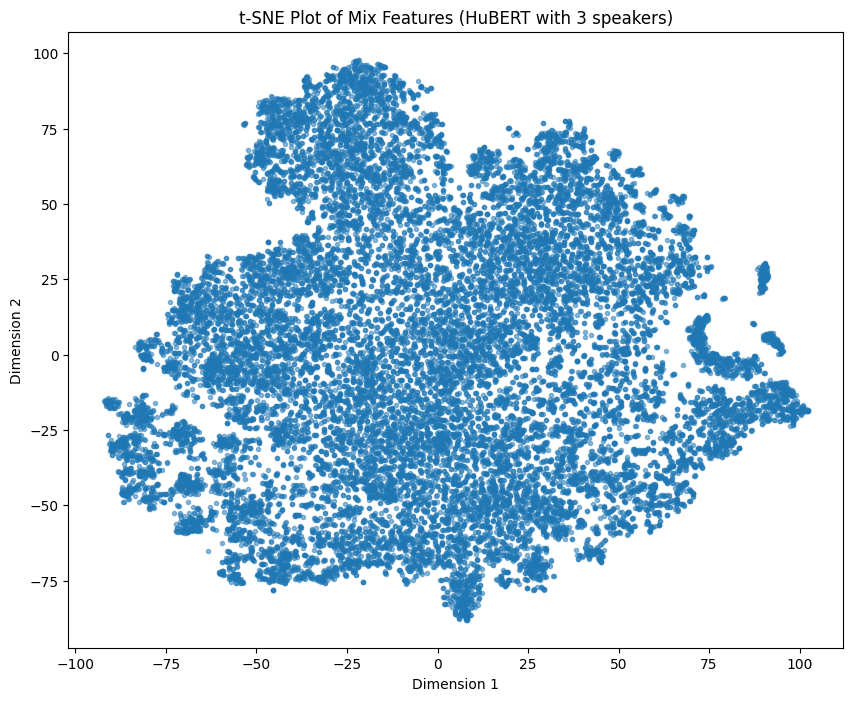

In [75]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot
plt.figure(figsize=(10, 8))
plt.scatter(mix_features_tsne[:, 0], mix_features_tsne[:, 1], marker='.', alpha=0.5)
plt.title('t-SNE Plot of Mix Features (HuBERT with 3 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.savefig(save_path + '\HuBERT with 3 speakers.png')
plt.show()


In [76]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, silhouette_score, calinski_harabasz_score, davies_bouldin_score, pairwise_distances

# Assuming source_features_np contains true labels
true_labels = source_features_np.flatten()

# Reshape true_labels to match the shape of mix_features_np
true_labels = true_labels[:len(mix_features_np)]

# Apply KMeans clustering to mix features
num_clusters = 3  # Adjust based on your use case
kmeans = KMeans(n_clusters=num_clusters, random_state=0)

# Fit KMeans to mix features
mix_cluster_labels = kmeans.fit_predict(mix_features_np)

# Evaluate various metrics
ari = adjusted_rand_score(true_labels, mix_cluster_labels)
nmi = normalized_mutual_info_score(true_labels, mix_cluster_labels)
silhouette = silhouette_score(mix_features_np, mix_cluster_labels)
calinski_harabasz = calinski_harabasz_score(mix_features_np, mix_cluster_labels)
davies_bouldin = davies_bouldin_score(mix_features_np, mix_cluster_labels)
avg_silhouette = silhouette.mean()

# Print the metrics
print(f"Adjusted Rand Index: {ari}")
print(f"Normalized Mutual Information: {nmi}")
print(f"Silhouette Score: {silhouette}")
print(f"Average Silhouette Score: {avg_silhouette}")
print(f"Calinski-Harabasz Index: {calinski_harabasz}")
print(f"Davies-Bouldin Index: {davies_bouldin}")


C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)


Adjusted Rand Index: -2.437976762281496e-08
Normalized Mutual Information: 0.17762394488832176
Silhouette Score: 0.198309525847435
Average Silhouette Score: 0.198309525847435
Calinski-Harabasz Index: 5823.0221990790915
Davies-Bouldin Index: 1.623337141772063


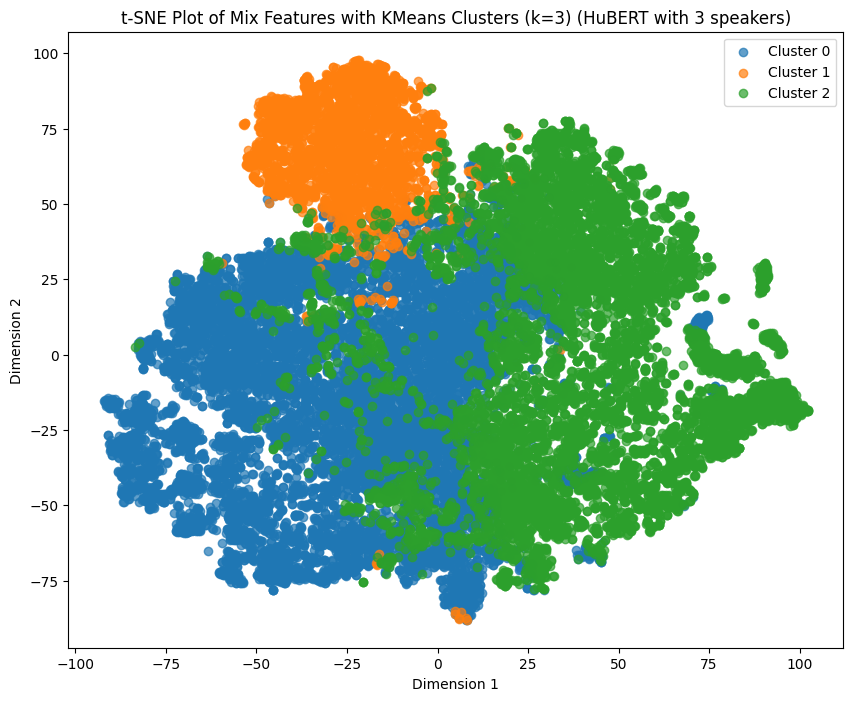

In [77]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot with cluster colors
plt.figure(figsize=(10, 8))
for cluster_label in range(num_clusters):
    cluster_points = mix_features_tsne[mix_cluster_labels == cluster_label]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {cluster_label}', alpha=0.7)

plt.title('t-SNE Plot of Mix Features with KMeans Clusters (k=3) (HuBERT with 3 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.savefig(save_path + '\HuBERT with 3 speakers k=3 KMeans.png')
plt.show()


In [78]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, silhouette_score, calinski_harabasz_score, davies_bouldin_score, pairwise_distances

# Assuming source_features_np contains true labels
true_labels = source_features_np.flatten()

# Reshape true_labels to match the shape of mix_features_np
true_labels = true_labels[:len(mix_features_np)]

# Apply KMeans clustering to mix features
num_clusters = 4  # Adjust based on your use case
kmeans = KMeans(n_clusters=num_clusters, random_state=0)

# Fit KMeans to mix features
mix_cluster_labels = kmeans.fit_predict(mix_features_np)

# Evaluate various metrics
ari = adjusted_rand_score(true_labels, mix_cluster_labels)
nmi = normalized_mutual_info_score(true_labels, mix_cluster_labels)
silhouette = silhouette_score(mix_features_np, mix_cluster_labels)
calinski_harabasz = calinski_harabasz_score(mix_features_np, mix_cluster_labels)
davies_bouldin = davies_bouldin_score(mix_features_np, mix_cluster_labels)
avg_silhouette = silhouette.mean()

# Print the metrics
print(f"Adjusted Rand Index: {ari}")
print(f"Normalized Mutual Information: {nmi}")
print(f"Silhouette Score: {silhouette}")
print(f"Average Silhouette Score: {avg_silhouette}")
print(f"Calinski-Harabasz Index: {calinski_harabasz}")
print(f"Davies-Bouldin Index: {davies_bouldin}")


C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)


Adjusted Rand Index: 2.5256944803110996e-09
Normalized Mutual Information: 0.22321589360130717
Silhouette Score: 0.16528025269508362
Average Silhouette Score: 0.16528025269508362
Calinski-Harabasz Index: 5128.3490424407355
Davies-Bouldin Index: 1.8004496244888455


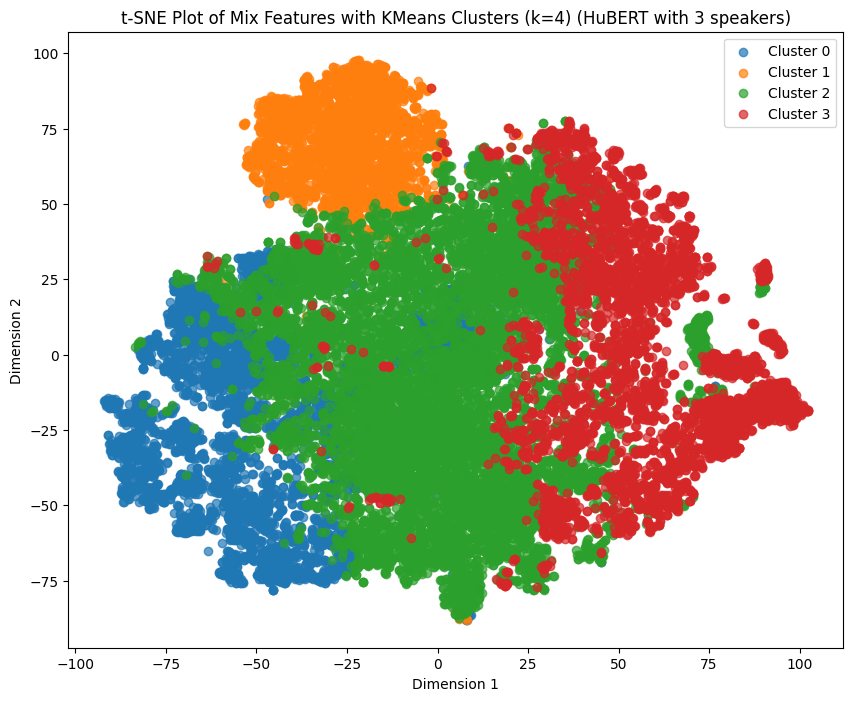

In [79]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot with cluster colors
plt.figure(figsize=(10, 8))
for cluster_label in range(num_clusters):
    cluster_points = mix_features_tsne[mix_cluster_labels == cluster_label]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {cluster_label}', alpha=0.7)

plt.title('t-SNE Plot of Mix Features with KMeans Clusters (k=4) (HuBERT with 3 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.savefig(save_path + '\HuBERT with 3 speakers k=4 KMeans.png')
plt.show()


In [80]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, silhouette_score, calinski_harabasz_score

# Assuming source_features_np contains true labels
true_labels = source_features_np.flatten()

# Reshape true_labels to match the shape of mix_features_np
true_labels = true_labels[:len(mix_features_np)]

# Apply Agglomerative Clustering to mix features
num_clusters = 3  # Adjust based on your use case
agglo = AgglomerativeClustering(n_clusters=num_clusters)
mix_cluster_labels = agglo.fit_predict(mix_features_np)

# Evaluate various metrics for Agglomerative Clustering
ari = adjusted_rand_score(true_labels, mix_cluster_labels)
nmi = normalized_mutual_info_score(true_labels, mix_cluster_labels)
silhouette = silhouette_score(mix_features_np, mix_cluster_labels)
calinski_harabasz = calinski_harabasz_score(mix_features_np, mix_cluster_labels)
davies_bouldin = davies_bouldin_score(mix_features_np, mix_cluster_labels)

# Print the metrics for Agglomerative Clustering
print("Agglomerative Clustering:")
print(f"Adjusted Rand Index (ARI): {ari}")
print(f"Normalized Mutual Information (NMI): {nmi}")
print(f"Silhouette Score: {silhouette}")
print(f"Calinski-Harabasz Index: {calinski_harabasz}")
print(f"Davies-Bouldin Index: {davies_bouldin}")


C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)


Agglomerative Clustering:
Adjusted Rand Index (ARI): -1.4935452908365444e-08
Normalized Mutual Information (NMI): 0.1527884346665447
Silhouette Score: 0.16032952070236206
Calinski-Harabasz Index: 4260.019145916184
Davies-Bouldin Index: 1.7588596417165323


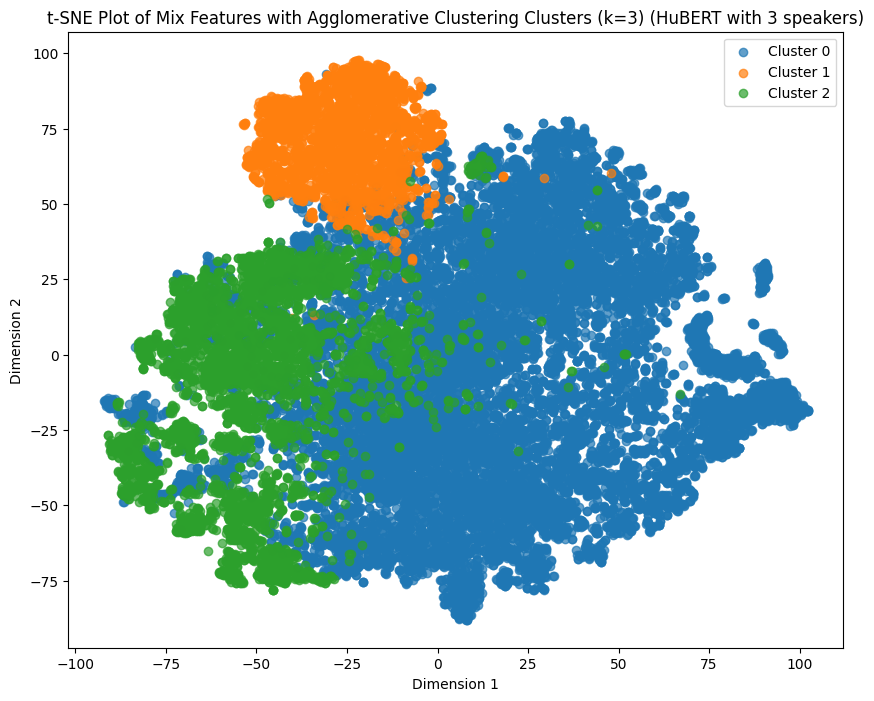

In [81]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot with cluster colors
plt.figure(figsize=(10, 8))
for cluster_label in range(num_clusters):
    cluster_points = mix_features_tsne[mix_cluster_labels == cluster_label]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {cluster_label}', alpha=0.7)

plt.title('t-SNE Plot of Mix Features with Agglomerative Clustering Clusters (k=3) (HuBERT with 3 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.savefig(save_path + '\HuBERT with 3 speakers k=3 Agglomerative.png')
plt.show()


In [82]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

# Assuming source_features_np contains true labels
true_labels = source_features_np.flatten()

# Reshape true_labels to match the shape of mix_features_np
true_labels = true_labels[:len(mix_features_np)]

# Apply DBSCAN clustering to mix features
eps = 0.5  # Adjust based on your use case
min_samples = 2  # Adjust based on your use case
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
mix_cluster_labels = dbscan.fit_predict(mix_features_np)

# Evaluate various metrics for DBSCAN
ari = adjusted_rand_score(true_labels, mix_cluster_labels)
nmi = normalized_mutual_info_score(true_labels, mix_cluster_labels)
silhouette = silhouette_score(mix_features_np, mix_cluster_labels)
calinski_harabasz = calinski_harabasz_score(mix_features_np, mix_cluster_labels)
davies_bouldin = davies_bouldin_score(mix_features_np, mix_cluster_labels)

# Print the metrics for DBSCAN
print("DBSCAN:")
print(f"Adjusted Rand Index (ARI): {ari}")
print(f"Normalized Mutual Information (NMI): {nmi}")
print(f"Silhouette Score: {silhouette}")
print(f"Calinski-Harabasz Index: {calinski_harabasz}")
print(f"Davies-Bouldin Index: {davies_bouldin}")


C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)


DBSCAN:
Adjusted Rand Index (ARI): 3.4932853292625664e-11
Normalized Mutual Information (NMI): 0.000859875090332632
Silhouette Score: -0.25653567910194397
Calinski-Harabasz Index: 1.0213962834756933
Davies-Bouldin Index: 1.6702663563791706


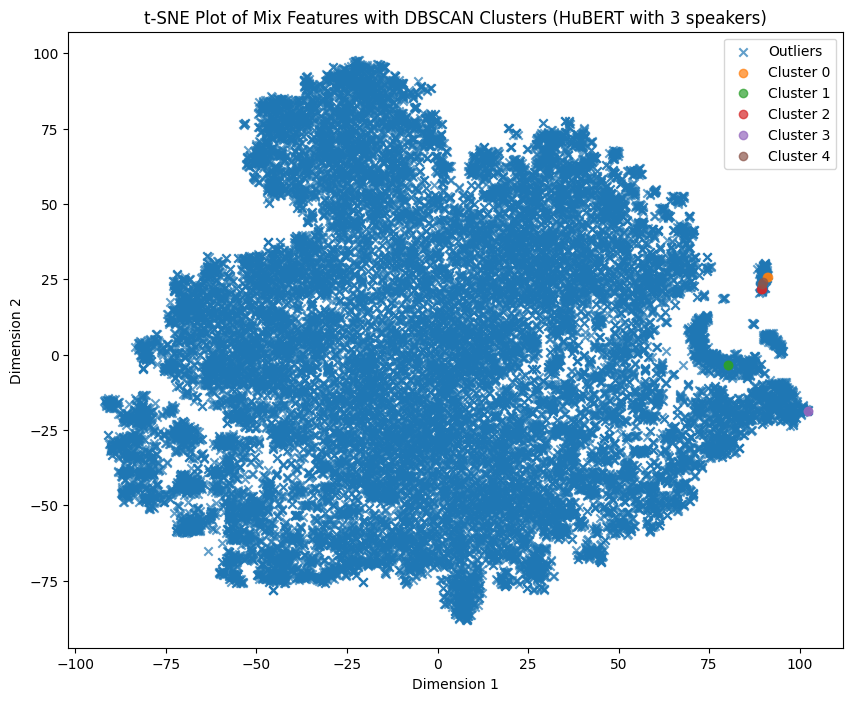

In [83]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot with DBSCAN clusters
plt.figure(figsize=(10, 8))



# Identify core samples and outliers
core_samples_mask = np.zeros_like(mix_cluster_labels, dtype=bool)
core_samples_mask[dbscan.core_sample_indices_] = True
outliers_mask = (mix_cluster_labels == -1) & ~core_samples_mask

outliers = mix_features_tsne[outliers_mask]
plt.scatter(outliers[:, 0], outliers[:, 1], marker='x', label='Outliers', alpha=0.7)

# Plot core samples with different colors for each cluster
for label in set(mix_cluster_labels):
    if label != -1:
        cluster_points = mix_features_tsne[mix_cluster_labels == label]
        plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {label}', alpha=0.7)

# Plot outliers with a different marker


plt.title('t-SNE Plot of Mix Features with DBSCAN Clusters (HuBERT with 3 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.savefig(save_path + '\HuBERT with 3 speakers DBSCAN.png')
plt.show()


In [84]:
from sklearn.mixture import GaussianMixture
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

# Assuming source_features_np contains true labels
true_labels = source_features_np.flatten()

# Reshape true_labels to match the shape of mix_features_np
true_labels = true_labels[:len(mix_features_np)]

# Apply Gaussian Mixture Model clustering to mix features
num_components = 3  # Adjust based on your use case
gmm = GaussianMixture(n_components=num_components)
mix_cluster_labels = gmm.fit_predict(mix_features_np)

# Evaluate various metrics for GMM
ari = adjusted_rand_score(true_labels, mix_cluster_labels)
nmi = normalized_mutual_info_score(true_labels, mix_cluster_labels)
silhouette = silhouette_score(mix_features_np, mix_cluster_labels)
calinski_harabasz = calinski_harabasz_score(mix_features_np, mix_cluster_labels)
davies_bouldin = davies_bouldin_score(mix_features_np, mix_cluster_labels)

# Print the metrics for GMM
print("Gaussian Mixture Model:")
print(f"Adjusted Rand Index (ARI): {ari}")
print(f"Normalized Mutual Information (NMI): {nmi}")
print(f"Silhouette Score: {silhouette}")
print(f"Calinski-Harabasz Index: {calinski_harabasz}")
print(f"Davies-Bouldin Index: {davies_bouldin}")


C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
C:\Users\Kedar Pandya\anaconda3\envs\friday\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)


Gaussian Mixture Model:
Adjusted Rand Index (ARI): -2.313881871436035e-08
Normalized Mutual Information (NMI): 0.18681953401461265
Silhouette Score: 0.07487571984529495
Calinski-Harabasz Index: 1365.9735260126477
Davies-Bouldin Index: 4.129231977780552


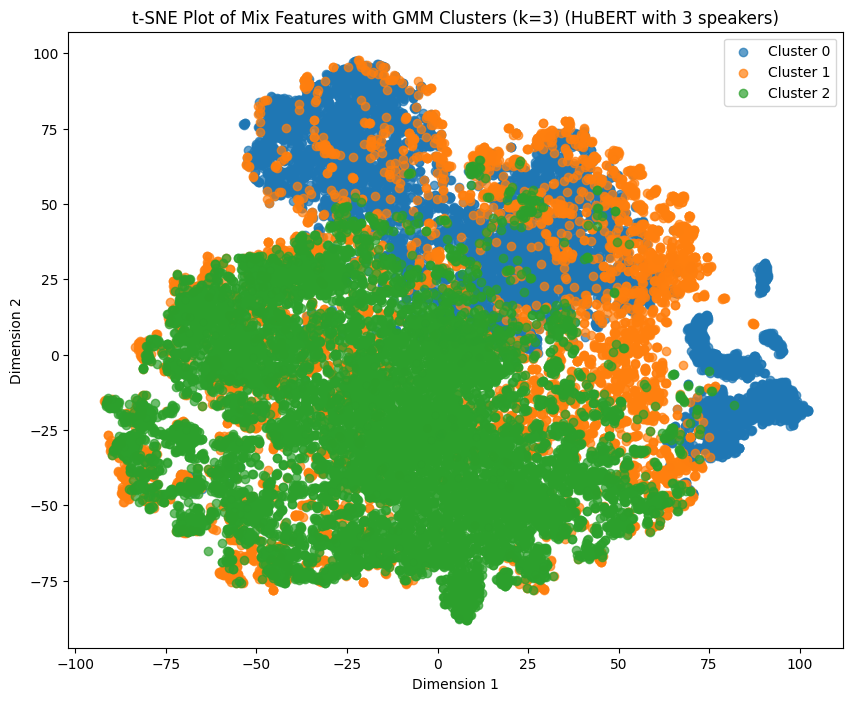

In [85]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
mix_features_tsne = tsne.fit_transform(mix_features_np)

# Plot the scatterplot with cluster colors
plt.figure(figsize=(10, 8))
for cluster_label in range(num_components):
    cluster_points = mix_features_tsne[mix_cluster_labels == cluster_label]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {cluster_label}', alpha=0.7)

plt.title('t-SNE Plot of Mix Features with GMM Clusters (k=3) (HuBERT with 3 speakers)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.savefig(save_path + '\HuBERT with 3 speakers k=3 GMM.png')
plt.show()
